```python
file1 \_ |-----------------------------------|   -+-
file2 \_ |-----------------------------------|    |   training data
file3 \_ |-----------------------------------|    |        80%
file4 \_ |-----------------------------------|    |
                                                 -+-
file5 \_ |-----------------------------------|    |  validation data
file6 \_ |-----------------------------------|    |        20%
         |-----------------------------------|   -+-
```

In [1]:
import os
import glob

import numpy as np
import pandas as pd
import zipfile
import matplotlib.pyplot as plt
from tqdm import tqdm
import math

from utils.MovingAverager import *

# 讀檔

In [2]:
def rename_data(df):
    new_names = ['system_time', 'acc_times', 'acc_x', 'acc_y', 'acc_z', 'gyo_times', 'gyo_x', 'gyo_y', 'gyo_z', 'lin_acc_times', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_times', 'mag_x', 'mag_y', 'mag_z']
    df.columns = new_names
    
    return df


def device_start_system_time(path):
    time_df = pd.read_csv(path, delimiter=';', index_col=0)
    time = time_df.T.loc['system time', 'START']
    
    return time


def smooth(df):
    df['acc_x'] = moving_average(df['acc_x'], 11)
    df['acc_y'] = moving_average(df['acc_y'], 11)
    df['acc_z'] = moving_average(df['acc_z'], 11)

    df['lin_acc_x'] = moving_average(df['lin_acc_x'], 11)
    df['lin_acc_y'] = moving_average(df['lin_acc_y'], 11)
    df['lin_acc_z'] = moving_average(df['lin_acc_z'], 11)
    
    df['mag_x'] = moving_average(df['mag_x'], 11)
    df['mag_y'] = moving_average(df['mag_y'], 11)
    df['mag_z'] = moving_average(df['mag_z'], 11)

    return df


def gen_total_mag(df: pd.DataFrame):
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def calculate_angle(df):
    df['acc_t'] = np.sqrt((df['acc_x'] ** 2) + (df['acc_y'] ** 2) + (df['acc_z'] ** 2))
    df[['gacc_x', 'gacc_y', 'gacc_z']] = df[['acc_x', 'acc_y', 'acc_z']].to_numpy() - df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']].to_numpy()
    df['gacc_t'] = np.sqrt((df['gacc_x'] ** 2) + (df['gacc_y'] ** 2) + (df['gacc_z'] ** 2))

    acc_xyz = df[['acc_x', 'acc_y', 'acc_z']].to_numpy()
    acc_t = df['acc_t'].to_numpy()
    gacc_t = df['gacc_t'].to_numpy()
    gacc_xyz = np.concatenate((np.zeros((len(df), 2)), gacc_t[:, None]), axis=-1)

    df['angle'] = np.arccos((np.sum(acc_xyz * gacc_xyz, axis=-1)) / (acc_t *  gacc_t)) / np.pi * 180
    
    return df


# def get_rotation_matrix(angle):
#     pitch = 0
#     roll = angle / 180 * np.pi
#     yaw = 0
#     p_m = [[np.cos(pitch), 0, np.sin(pitch)], [0, 1, 0], [-np.sin(pitch), 0, np.cos(pitch)]]
#     y_m = [[1, 0, 0], [0, np.cos(roll), -np.sin(roll)], [0, np.sin(roll), np.cos(roll)]]
#     r_m = [[np.cos(yaw), -np.sin(yaw), 0], [np.sin(yaw), np.cos(yaw), 0], [0, 0, 1]]
    
#     p_m, y_m, r_m = np.array(p_m), np.array(y_m), np.array(r_m)
#     rotation_matrix = p_m @ y_m @ r_m
    
#     return rotation_matrix


# def calculate_transform(row, column_name):
#     R = get_rotation_matrix(row['angle'] - 45)
#     new_row = R @ row[column_name]
    
#     return new_row


def calculate_rotation_matrix_from_vectors(vec1, vec2):
    """ Find the rotation matrix that aligns vec1 to vec2
    :param vec1: A 3d "source" vector
    :param vec2: A 3d "destination" vector
    :return mat: A transform matrix (3x3) which when applied to vec1, aligns it with vec2.
    """
    a, b = (vec1 / np.linalg.norm(vec1)).reshape(3), (vec2 / np.linalg.norm(vec2)).reshape(3)
    v = np.cross(a, b)
    c = np.dot(a, b)
    s = np.linalg.norm(v)
    kmat = np.array([[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]])
    rotation_matrix = np.eye(3) + kmat + kmat.dot(kmat) * ((1 - c) / (s ** 2))
    return rotation_matrix


def rotate_vectors(row):
    acc_t = np.sqrt((row['acc_x'] ** 2) + (row['acc_y'] ** 2) + (row['acc_z'] ** 2))
    gacc_x, gacc_y, gacc_z = row[['acc_x', 'acc_y', 'acc_z']].to_numpy() - row[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']].to_numpy()
    gacc_t = np.sqrt((gacc_x ** 2) + (gacc_y ** 2) + (gacc_z ** 2))

    old_gacc_xyz = np.array([gacc_x, gacc_y, gacc_z])
    n_gacc = np.sqrt(2) / 2 * gacc_t
    new_gacc_xyz = np.array([0, n_gacc, n_gacc])

    transformation_matrix = calculate_rotation_matrix_from_vectors(old_gacc_xyz, new_gacc_xyz)

    return np.concatenate((transformation_matrix @ row[['acc_x', 'acc_y', 'acc_z']], transformation_matrix @ row[['lin_acc_x', 'lin_acc_y', 'lin_acc_z']], transformation_matrix @ row[['mag_x', 'mag_y', 'mag_z']]))


def gen_45_mag(df):
#     df[['mag_x', 'mag_y', 'mag_z']] = df.apply(lambda x: calculate_transform(x, ['mag_x', 'mag_y', 'mag_z']), axis=1, result_type='expand')
#     df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))

    df[['acc_x', 'acc_y', 'acc_z', 'lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'mag_x', 'mag_y', 'mag_z']] = df.apply(lambda x: rotate_vectors(x), axis=1, result_type='expand')
    df['mag_t'] = np.sqrt((df['mag_x'] ** 2) + (df['mag_y'] ** 2) + (df['mag_z'] ** 2))
    
    return df


def select_data(df):
    return df[['lin_acc_x', 'lin_acc_y', 'lin_acc_z', 'gyo_x', 'gyo_y', 'gyo_z', 'angle', 'mag_x', 'mag_y', 'mag_z', 'mag_t', 'system_time']]


def load_original_data(path, rotate=False):
    acc_df = pd.read_csv(os.path.join(path, 'Accelerometer.csv'), delimiter=';')
    gyo_df = pd.read_csv(os.path.join(path, 'Gyroscope.csv'), delimiter=';')
    linacc_df = pd.read_csv(os.path.join(path, 'Linear Accelerometer.csv'), delimiter=';')
    mag_df = pd.read_csv(os.path.join(path, 'Magnetometer.csv'), delimiter=';')
    start_time = device_start_system_time(os.path.join(path, 'meta/time.csv'))
    time_df = acc_df.iloc[:, 0] + start_time
    
    total_df = pd.concat([time_df, acc_df, gyo_df, linacc_df, mag_df], axis=1)
    total_df = total_df[:-5]  # remove last None value row
    total_df = rename_data(total_df)
    
    total_df = smooth(total_df)
    total_df = gen_total_mag(total_df)
    
    if rotate:
        total_df = gen_45_mag(total_df)
    total_df = calculate_angle(total_df)
    total_df = select_data(total_df)
    
    return total_df

In [3]:
def align_data(source_df, target_df):
    source_start_time = source_df.loc[0, 'system_time']
    target_start_time = target_df.loc[0, 'system_time']
    
    # align start time
    if source_start_time > target_start_time:  # source start time > target start time
        target_start_idx = np.argmin(np.abs(target_df.system_time - source_start_time))
        target_df = target_df.iloc[target_start_idx:].reset_index(drop=True)
    else:  # source start time < target start time
        source_start_idx = np.argmin(np.abs(source_df.system_time - target_start_time))
        source_df = source_df.iloc[source_start_idx:].reset_index(drop=True)
    
    # align end idx
    end_idx = min(len(source_df), len(target_df))
    source_df = source_df.iloc[:end_idx]
    target_df = target_df.iloc[:end_idx]
    
    return source_df, target_df


def bound_range(df):
    start = datapoint_per_second * 35
    end = len(df) - datapoint_per_second * 20
    
    return df.iloc[start:end].reset_index(drop=True)


def split_segments(df, seq_len=25):
    num_of_segs = int(np.floor(len(df) / seq_len))
    
    segments = []
    for i in range(num_of_segs):
        seg = df.iloc[int(i * seq_len):int((i + 1) * seq_len)].to_numpy()
        segments.append(seg)
        
    return segments


def split_segments_overlap(df, seq_len=25, shift=15):
    
    segments = []
    for i in range(0, len(df) - seq_len, shift):
        seg = df.iloc[i:i + seq_len].to_numpy()
        segments.append(seg)
        
    return segments


def preprocess_data(df, seq_len=25, shift=15, is_train_data=False):
    if is_train_data:
        segs = split_segments_overlap(df, seq_len, shift)
    else:
        segs = split_segments(df, seq_len)
    
    return segs

In [4]:
def device_version(path):
    device_df = pd.read_csv(path, delimiter=';', index_col=0)
    version = device_df.loc['deviceRelease'].value
    
    return version


def check_data_device(source_path, target_path):
    while True:
        source_version = device_version(os.path.join(source_path, 'meta/device.csv'))
        target_version = device_version(os.path.join(target_path, 'meta/device.csv'))

#         print(source_path, target_path)

        if source_version[:2] == '15' and target_version[:2] == '16':
            return source_path, target_path
        elif source_version[:2] == '16' and target_version[:2] == '15':
            source_path = os.path.join(folder_path, 'target')
            target_path = os.path.join(folder_path, 'source')
            print('--- GG ---')
            continue
        else:
            raise


def load_pair_data(root_folder, class_num, file_index=None, is_train_data=False):
    prefix = 'train' if is_train_data else 'valid'
    pair_data = []
    folder_paths = glob.glob(f'*{os.path.normpath(root_folder)}/*')

    if file_index is not None:
        folder_paths = folder_paths[file_index[0]:file_index[1]]

    for i, folder_path in enumerate(folder_paths):
        source_path = os.path.join(folder_path, 'source')
        target_path = os.path.join(folder_path, 'target')
        
        print(f'{prefix} {i + 1: >3}: {folder_path}')
        
        #########################
        ##### check devices #####
        #########################
        source_path, target_path = check_data_device(source_path, target_path)
        
        ####################################
        ##### load and preprocess data #####
        ####################################
        source_df = load_original_data(source_path, rotate=False)
        target_df = load_original_data(target_path, rotate=True)
        
#         print(source_df.system_time[0], target_df.system_time[0])
        
        source_df, target_df = bound_range(source_df), bound_range(target_df)
        source_df, target_df = align_data(source_df, target_df)

        source_segs = preprocess_data(source_df, seq_len, shift, is_train_data)
        target_segs = preprocess_data(target_df, seq_len, shift, is_train_data)
        
        idx = min(len(source_segs), len(target_segs))
        source_tags = [class_num] * idx
        target_tags = [0] * idx
        
        pair_data.extend(zip(source_segs[:idx], source_tags, target_segs[:idx], target_tags))
        
    return pair_data

In [5]:
datapoint_per_second = 20
duration = 2
seq_len = 25
shift = 15  # the shfit of the data
classes = {0: 'target', 1: 'front_pocket', 2: 'pocket', 3: 'swing'}

In [6]:
source_device_version = device_version('./front_pocket/202302071523/source/meta/device.csv')
target_device_version = device_version('./front_pocket/202302071523/target/meta/device.csv')
print(f"source device version: {source_device_version}")  # source version: 15.4
print(f"target device version: {target_device_version}")  # target version: 16.3

source device version: 15.4
target device version: 16.3


In [7]:
train_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[0, 8], is_train_data=True)
valid_front_pocket_pair_data = load_pair_data('./front_pocket', class_num=1, file_index=[8, 10], is_train_data=False)

train_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[0, 8], is_train_data=True)
valid_pocket_pair_data = load_pair_data('./pocket', class_num=2, file_index=[8, 10], is_train_data=False)

train_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[0, 8], is_train_data=True)
valid_swing_pair_data = load_pair_data('./swing', class_num=3, file_index=[8, 10], is_train_data=False)

train   1: front_pocket/202302071628
train   2: front_pocket/202302071652
train   3: front_pocket/202302071523
train   4: front_pocket/202302071531
train   5: front_pocket/202302071715
train   6: front_pocket/202302071641
train   7: front_pocket/202302071541
train   8: front_pocket/202302071619
valid   1: front_pocket/202302071704
valid   2: front_pocket/202302071724
train   1: pocket/202302132108
train   2: pocket/202302131750
train   3: pocket/202302131601
train   4: pocket/202302071606
train   5: pocket/202302132053
train   6: pocket/202302122132
train   7: pocket/202302132116
train   8: pocket/202302131643
valid   1: pocket/202301101952
valid   2: pocket/202302132101
train   1: swing/202302142339
train   2: swing/202302132131
train   3: swing/202302142117
train   4: swing/202302132124
train   5: swing/202302121947
train   6: swing/202302121857
train   7: swing/202302142128
train   8: swing/202302121920
valid   1: swing/202302121909
valid   2: swing/202302142331


In [8]:
print(len(train_front_pocket_pair_data), len(train_pocket_pair_data), len(train_swing_pair_data))

3070 3003 2900


In [9]:
train_front_pocket_pair_data[0][0][0], train_front_pocket_pair_data[0][2][0]

(array([-3.50329294e-01,  1.51894025e-01,  2.26504005e-01, -2.18800381e-01,
        -2.56263137e-01, -2.19771296e-01,  8.89969956e+01,  1.90718285e+01,
        -1.88885755e+01,  3.45052268e+01,  4.37163997e+01,  1.67575811e+09]),
 array([-1.29357491e-01, -1.25323302e-01,  1.30018450e-01, -5.08982837e-02,
        -8.86559859e-02,  1.07779831e-01,  4.39571094e+01, -4.00427488e+01,
        -3.84654723e+00, -1.95729747e+01,  4.47361040e+01,  1.67575811e+09]))

# 建立dataloader

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score

In [11]:
class PairDataset(Dataset):
    def __init__(self, source_data, source_label, target_data, target_label):
        self.source_data = source_data
        self.source_label = source_label
        self.target_data = target_data
        self.target_label = target_label

    def __len__(self):
        return len(self.source_data)

    def __getitem__(self, idx):
        return self.source_data[idx], self.source_label[idx], self.target_data[idx], self.target_label[idx]

In [12]:
class FirstDerivativeLoss(nn.Module):
    def __init__(self, weight=None, size_average=None, reduce=None, reduction='mean'):
        super(FirstDerivativeLoss, self).__init__()

    def forward(self, source, target):
        # calculate the first derivative
        source_o = torch.reshape(source, (len(source), -1))
        target_o = torch.reshape(target, (len(target), -1))
        d_source = source_o[1:] - source_o[:-1]
        d_target = target_o[1:] - target_o[:-1]
        deriv = d_source - d_target

        # calculate the loss as the mean squared error of the derivative
        loss = torch.mean(torch.pow(deriv, 2))

        return loss

In [13]:
def generator_loss(z_imu, target_imu, predict_mag, target_mag, source_total_mag, target_total_mag):
    imu_loss = mse_loss(z_imu, target_imu)
    mag_loss = mse_loss(predict_mag, target_mag)
    d1_loss = div_loss(predict_mag, target_mag)
    
    pred_total_mag = torch.sqrt(torch.sum(torch.pow(predict_mag, 2), dim=-1))
    
#     print(source_total_mag.shape, target_total_mag.shape, pred_total_mag.shape)
#     print(source_total_mag[0])
#     print(target_total_mag[0])
#     print(pred_total_mag[0])
    
    smag_limitation_loss = torch.mean(torch.abs(pred_total_mag - source_total_mag))
    tmag_limitation_loss = torch.mean(torch.abs(pred_total_mag - target_total_mag))

    total_loss = imu_loss + mag_loss + d1_loss + smag_limitation_loss * 0.25 + tmag_limitation_loss * 0.75
    return total_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss)

# def discriminator_loss(d_real, d_fake):
#     real_loss = bce_loss(d_real, torch.ones_like(d_real))
#     fake_loss = bce_loss(d_fake, torch.zeros_like(d_fake))

#     return real_loss + fake_loss

In [14]:
train_data = train_front_pocket_pair_data + train_pocket_pair_data + train_swing_pair_data
valid_data = valid_front_pocket_pair_data + valid_pocket_pair_data + valid_swing_pair_data

# train
train_source_data = np.array([d[0] for d in train_data])
train_source_label = np.array([d[1] for d in train_data])
train_target_data = np.array([d[2] for d in train_data])
train_target_label = np.array([d[3] for d in train_data])
train_dataset = PairDataset(
                    source_data = torch.tensor(train_source_data, dtype=torch.float),
                    source_label = train_source_label,
                    target_data = torch.tensor(train_target_data, dtype=torch.float),
                    target_label = train_target_label,
                )
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)

# valid
valid_source_data = np.array([d[0] for d in valid_data])
valid_source_label = np.array([d[1] for d in valid_data])
valid_target_data = np.array([d[2] for d in valid_data])
valid_target_label = np.array([d[3] for d in valid_data])
valid_dataset = PairDataset(
                    source_data = torch.tensor(valid_source_data, dtype=torch.float),
                    source_label = valid_source_label,
                    target_data = torch.tensor(valid_target_data, dtype=torch.float),
                    target_label = valid_target_label,
                )
valid_loader = DataLoader(valid_dataset, batch_size=512)

In [15]:
batch = next(iter(train_loader))

In [16]:
EPOCH = 6000
num_of_classes = 4
device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
ce_loss = torch.nn.CrossEntropyLoss()
mse_loss = torch.nn.MSELoss()
bce_loss = torch.nn.BCELoss()
div_loss = FirstDerivativeLoss()

In [17]:
def get_tgt_mask(size) -> torch.tensor:
    # Generates a squeare matrix where the each row allows one word more to be seen
    mask = torch.tril(torch.ones(size, size) == 1) # Lower triangular matrix
    mask = mask.float()
    mask = mask.masked_fill(mask == 0, float('-inf')) # Convert zeros to -inf
    mask = mask.masked_fill(mask == 1, float(0.0)) # Convert ones to 0

    # EX for size=5:
    # [[0., -inf, -inf, -inf, -inf],
    #  [0.,   0., -inf, -inf, -inf],
    #  [0.,   0.,   0., -inf, -inf],
    #  [0.,   0.,   0.,   0., -inf],
    #  [0.,   0.,   0.,   0.,   0.]]

    return mask

In [18]:
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :].to(x.device)
        return self.dropout(x)
    

class NotSimpleTransformer(nn.Module):
    def __init__(self, seq_len=21, num_of_classes=2):
        super(NotSimpleTransformer, self).__init__()
        
        self.seq_len = seq_len
        self.num_of_classes = num_of_classes
        
        self.imu_layer = nn.Sequential(
            nn.Linear(6, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 64),
            nn.LeakyReLU(),
        )
        self.mag_layer = nn.Sequential(
            nn.Linear(3, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 64),
            nn.LeakyReLU(),
        )
        self.pos_encoder = PositionalEncoding(64, 0.1)
        
        self.encoder = nn.TransformerEncoder(nn.TransformerEncoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        self.nn = nn.Sequential(
            nn.Linear(64, 32),
            nn.LeakyReLU(),
            nn.Linear(32, 6),
            nn.LeakyReLU(),
        )
        
        self.decoder = nn.TransformerDecoder(nn.TransformerDecoderLayer(d_model=64, nhead=8, dropout=0.1, batch_first=True), num_layers=1)
        
        self.mag_last = nn.Sequential(
            nn.Linear(64, 16),
            nn.LeakyReLU(),
            nn.Linear(16, 3),
        )
        
    def forward(self, source_imu, source_mag):
        
        ### step 1
        h_imu = self.imu_layer(source_imu)
        h_imu = self.pos_encoder(h_imu)
        
        h_mag = self.mag_layer(source_mag)
        h_mag = self.pos_encoder(h_mag)
        
        ### step 2
        z = self.encoder(h_imu)
        z_imu = self.nn(z)
        
        ### step 3
        pred_latent = self.decoder(h_mag, z)
        pred_mag = self.mag_last(pred_latent)
        
        return z_imu, pred_mag
        

In [19]:
model = NotSimpleTransformer(seq_len=seq_len, num_of_classes=num_of_classes).to(device)
# discriminator = Discriminator(chunk_size=chunk_size, seq_len=seq_len).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.00005)
# optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.000025)

In [20]:
output = model(torch.empty(16, 25, 6).to(device), torch.empty(16, 25, 3).to(device))
output[0].shape, output[1].shape

(torch.Size([16, 25, 6]), torch.Size([16, 25, 3]))

In [21]:
from torchinfo import summary
summary(model, input_size=[(1, 25, 6), (1, 25, 3)])

Layer (type:depth-idx)                        Output Shape              Param #
NotSimpleTransformer                          [1, 25, 6]                --
├─Sequential: 1-1                             [1, 25, 64]               --
│    └─Linear: 2-1                            [1, 25, 32]               224
│    └─LeakyReLU: 2-2                         [1, 25, 32]               --
│    └─Linear: 2-3                            [1, 25, 64]               2,112
│    └─LeakyReLU: 2-4                         [1, 25, 64]               --
├─PositionalEncoding: 1-2                     [1, 25, 64]               --
│    └─Dropout: 2-5                           [1, 25, 64]               --
├─Sequential: 1-3                             [1, 25, 64]               --
│    └─Linear: 2-6                            [1, 25, 16]               64
│    └─LeakyReLU: 2-7                         [1, 25, 16]               --
│    └─Linear: 2-8                            [1, 25, 64]               1,088
│    └─LeakyR

In [22]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [23]:
def train(dataloader, draw=False):
    model.train()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []

    for source_data, source_label, target_data, target_label in dataloader:
        optimizer.zero_grad()

        source_data = source_data.to(device)
        source_imu = source_data[:, :, :6]
        source_mag = source_data[:, :, 7:10]
        source_total_mag = source_data[:, :, 10]
        
        target_data = target_data.to(device)
        target_imu = target_data[:, :, :6]
        target_mag = target_data[:, :, 7:10]
        target_total_mag = target_data[:, :, 10]

        # generate mag
        z_imu, predict_mag = model(source_imu, source_mag)
        
        # generator loss
        gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                              source_total_mag, target_total_mag)
        
        # backward
        gen_loss.backward()
        optimizer.step()
        
        # record loss
        g_losses.append(gen_loss.item())
        imu_losses.append(imu_loss.item())
        mag_losses.append(mag_loss.item())
        d1_losses.append(d1_loss.item())
        lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

In [24]:
def evalute(dataloader, draw=False):
    model.eval()

    g_losses = []
    imu_losses = []
    mag_losses = []
    d1_losses = []
    lim_loss = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]
            source_total_mag = source_data[:, :, 10]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]
            target_total_mag = target_data[:, :, 10]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
            gen_loss, (imu_loss, mag_loss, d1_loss, smag_limitation_loss, tmag_limitation_loss) = generator_loss(z_imu, target_imu, predict_mag, target_mag,
                                                                                                  source_total_mag, target_total_mag)

            # record loss
            g_losses.append(gen_loss.item())
            imu_losses.append(imu_loss.item())
            mag_losses.append(mag_loss.item())
            d1_losses.append(d1_loss.item())
            lim_loss.append([smag_limitation_loss.item(), tmag_limitation_loss.item()])
    
    if draw:
        rs = [predict_mag[0].detach().cpu().numpy(), target_mag[0].cpu().numpy()]
        plot_result(rs)
    
    return np.mean(g_losses), np.mean(imu_losses), np.mean(mag_losses), np.mean(d1_losses), np.mean(lim_loss, axis=0)

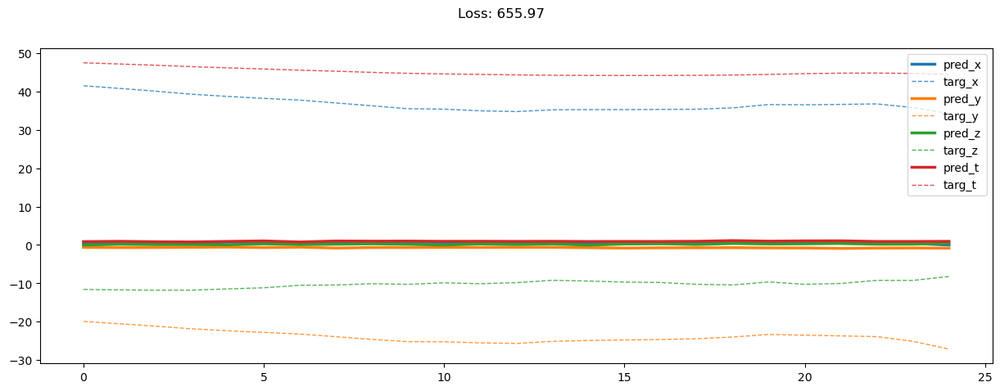

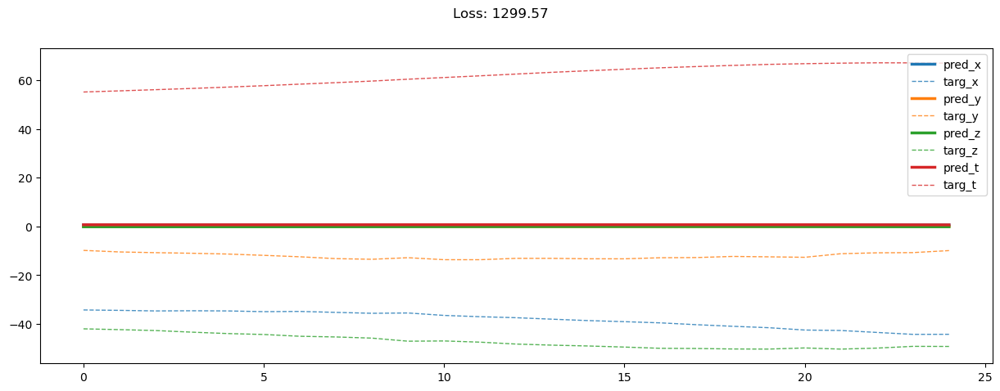

00020: train loss:  1523.011, imu loss:  0.146, mag loss:  618.107, div loss:  864.192, slim:  40.581, tlim:  40.560
       valid loss:  777.261, imu loss:  0.114, mag loss:  606.449, div loss:  130.396, slim:  40.706, tlim:  40.167
00040: train loss:  1381.480, imu loss:  0.142, mag loss:  560.240, div loss:  783.171, slim:  37.933, tlim:  37.925
       valid loss:  700.929, imu loss:  0.109, mag loss:  540.010, div loss:  123.263, slim:  37.950, tlim:  37.411
00060: train loss:  1220.208, imu loss:  0.141, mag loss:  495.384, div loss:  689.816, slim:  34.887, tlim:  34.860
       valid loss:  622.658, imu loss:  0.109, mag loss:  470.998, div loss:  117.301, slim:  34.655, tlim:  34.114
00080: train loss:  1047.904, imu loss:  0.140, mag loss:  422.552, div loss:  593.997, slim:  31.243, tlim:  31.205
       valid loss:  537.051, imu loss:  0.109, mag loss:  395.082, div loss:  111.546, slim:  30.733, tlim:  30.173
00100: train loss:  877.272, imu loss:  0.141, mag loss:  349.397, d

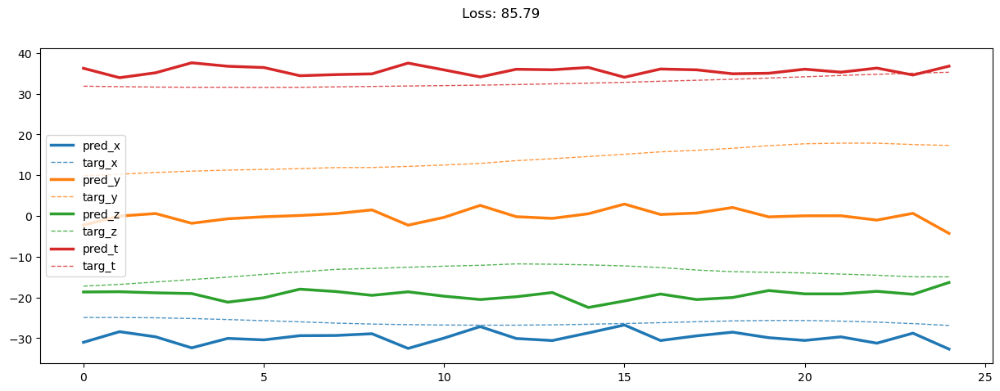

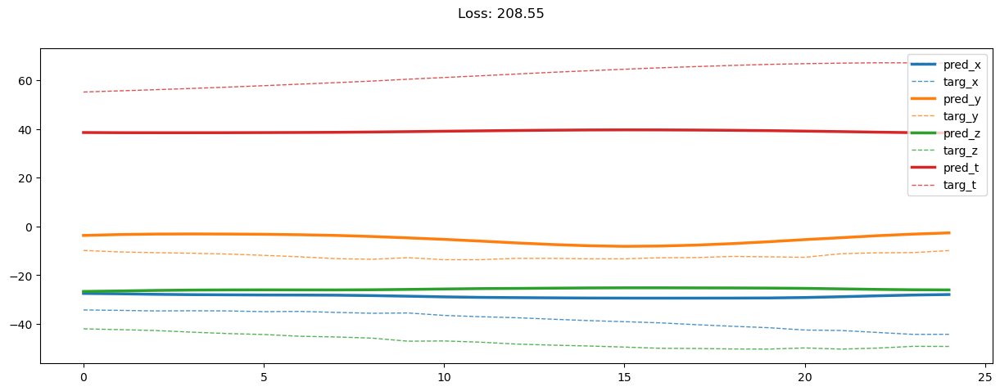

00200: train loss:  357.160, imu loss:  0.140, mag loss:  117.510, div loss:  228.391, slim:  12.083, tlim:  10.797
       valid loss:  208.512, imu loss:  0.109, mag loss:  103.358, div loss:  94.696, slim:  11.604, tlim:  9.931
00220: train loss:  322.933, imu loss:  0.140, mag loss:  105.285, div loss:  207.339, slim:  11.251, tlim:  9.807
       valid loss:  199.412, imu loss:  0.108, mag loss:  95.550, div loss:  94.084, slim:  10.975, tlim:  9.234
00240: train loss:  299.941, imu loss:  0.140, mag loss:  97.578, div loss:  192.699, slim:  10.650, tlim:  9.148
       valid loss:  191.561, imu loss:  0.108, mag loss:  90.740, div loss:  91.485, slim:  10.560, tlim:  8.785
00260: train loss:  273.480, imu loss:  0.140, mag loss:  88.751, div loss:  175.953, slim:  9.715, tlim:  8.275
       valid loss:  178.649, imu loss:  0.108, mag loss:  82.900, div loss:  87.240, slim:  9.691, tlim:  7.971
00280: train loss:  250.141, imu loss:  0.140, mag loss:  80.810, div loss:  161.653, slim

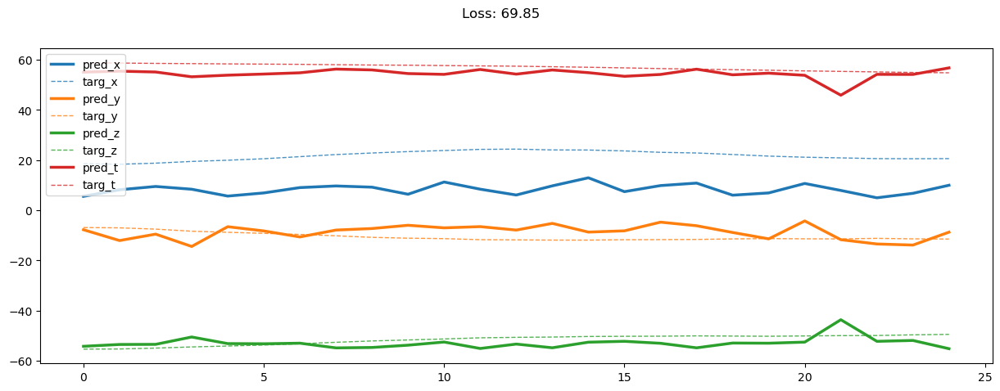

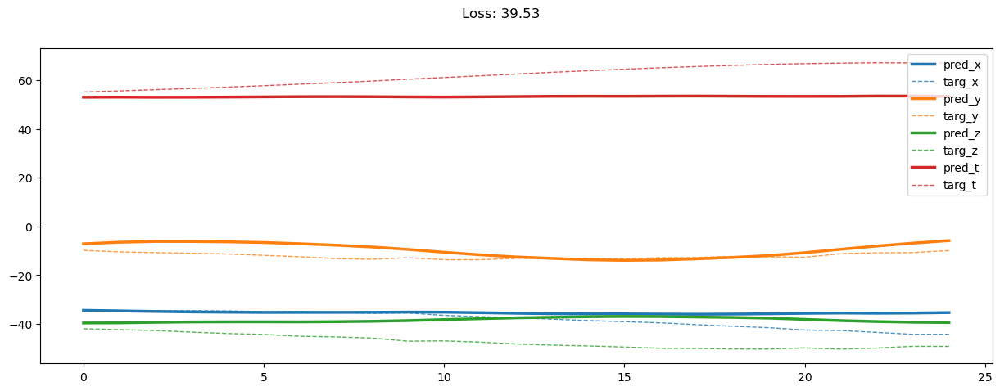

00400: train loss:  178.977, imu loss:  0.140, mag loss:  58.288, div loss:  115.320, slim:  5.819, tlim:  5.032
       valid loss:  127.787, imu loss:  0.107, mag loss:  56.226, div loss:  66.146, slim:  6.053, tlim:  5.060
00420: train loss:  173.610, imu loss:  0.140, mag loss:  56.273, div loss:  112.087, slim:  5.684, tlim:  4.919
       valid loss:  125.288, imu loss:  0.107, mag loss:  54.623, div loss:  65.312, slim:  5.966, tlim:  5.004
00440: train loss:  168.107, imu loss:  0.139, mag loss:  54.498, div loss:  108.442, slim:  5.598, tlim:  4.840
       valid loss:  123.069, imu loss:  0.107, mag loss:  53.518, div loss:  64.286, slim:  5.870, tlim:  4.921
00460: train loss:  163.675, imu loss:  0.139, mag loss:  52.990, div loss:  105.612, slim:  5.479, tlim:  4.752
       valid loss:  121.343, imu loss:  0.107, mag loss:  52.728, div loss:  63.390, slim:  5.818, tlim:  4.885
00480: train loss:  158.967, imu loss:  0.139, mag loss:  51.589, div loss:  102.371, slim:  5.421, 

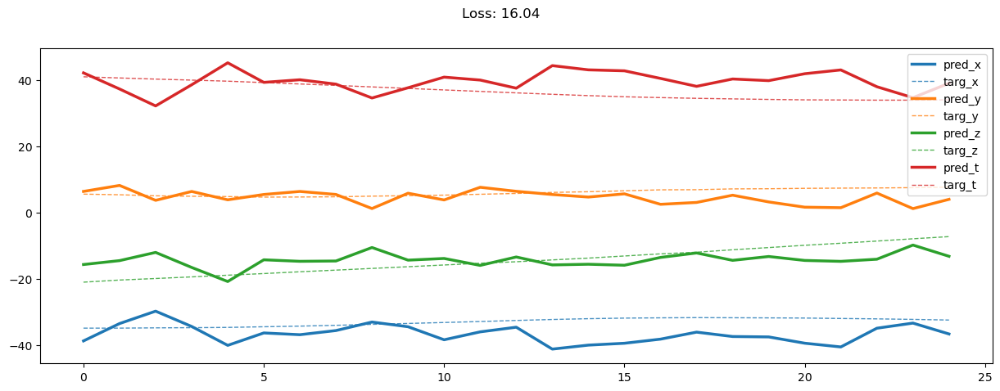

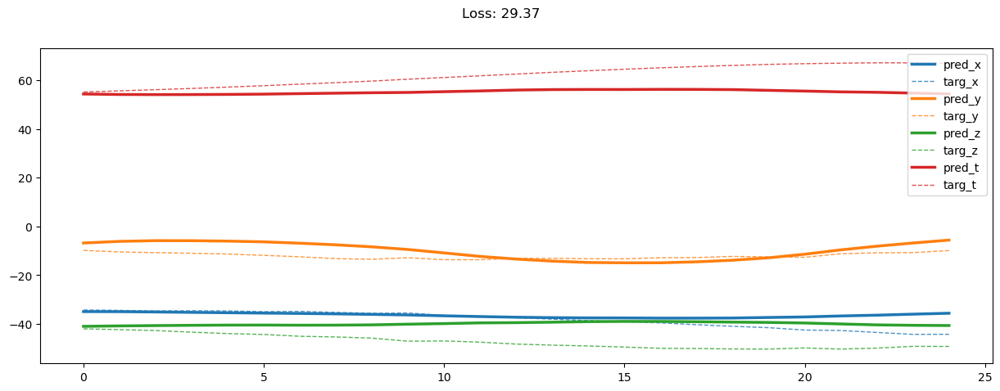

00600: train loss:  140.569, imu loss:  0.138, mag loss:  45.496, div loss:  90.382, slim:  5.108, tlim:  4.368
       valid loss:  113.528, imu loss:  0.106, mag loss:  48.036, div loss:  60.518, slim:  5.542, tlim:  4.642
00620: train loss:  139.373, imu loss:  0.138, mag loss:  44.886, div loss:  89.815, slim:  5.104, tlim:  4.345
       valid loss:  113.646, imu loss:  0.106, mag loss:  48.319, div loss:  60.376, slim:  5.523, tlim:  4.619
00640: train loss:  135.348, imu loss:  0.138, mag loss:  43.899, div loss:  86.808, slim:  5.088, tlim:  4.308
       valid loss:  113.118, imu loss:  0.106, mag loss:  47.908, div loss:  60.309, slim:  5.474, tlim:  4.570
00660: train loss:  133.446, imu loss:  0.138, mag loss:  43.078, div loss:  85.779, slim:  5.023, tlim:  4.260
       valid loss:  112.362, imu loss:  0.106, mag loss:  47.282, div loss:  60.213, slim:  5.416, tlim:  4.543
00680: train loss:  132.321, imu loss:  0.138, mag loss:  42.587, div loss:  85.152, slim:  5.005, tlim:

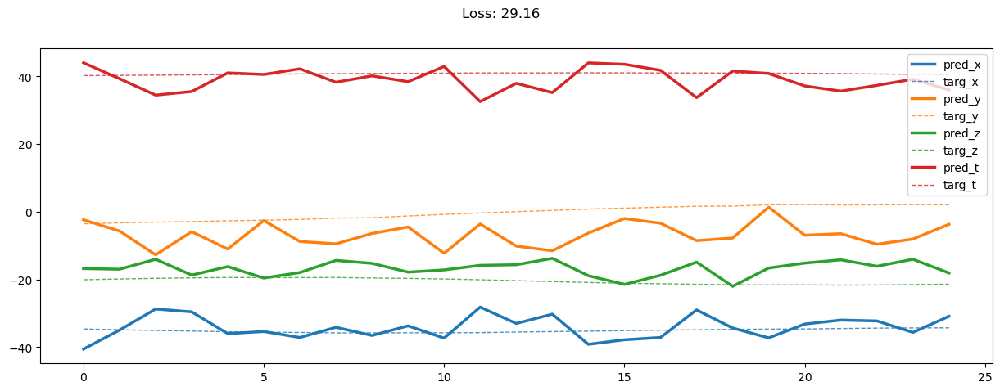

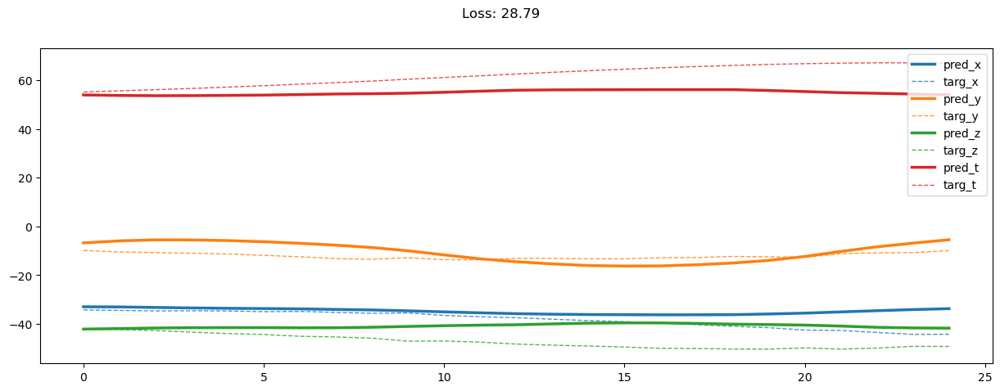

00800: train loss:  122.629, imu loss:  0.138, mag loss:  39.577, div loss:  78.616, slim:  4.912, tlim:  4.093
       valid loss:  110.855, imu loss:  0.105, mag loss:  46.887, div loss:  59.142, slim:  5.368, tlim:  4.505
00820: train loss:  121.230, imu loss:  0.137, mag loss:  38.957, div loss:  77.877, slim:  4.861, tlim:  4.058
       valid loss:  109.507, imu loss:  0.105, mag loss:  45.736, div loss:  58.987, slim:  5.305, tlim:  4.471
00840: train loss:  119.270, imu loss:  0.137, mag loss:  38.505, div loss:  76.390, slim:  4.841, tlim:  4.037
       valid loss:  109.876, imu loss:  0.105, mag loss:  45.831, div loss:  59.272, slim:  5.304, tlim:  4.455
00860: train loss:  118.202, imu loss:  0.137, mag loss:  37.954, div loss:  75.883, slim:  4.845, tlim:  4.022
       valid loss:  109.299, imu loss:  0.104, mag loss:  46.183, div loss:  58.367, slim:  5.291, tlim:  4.429
00880: train loss:  117.101, imu loss:  0.137, mag loss:  37.513, div loss:  75.224, slim:  4.860, tlim:

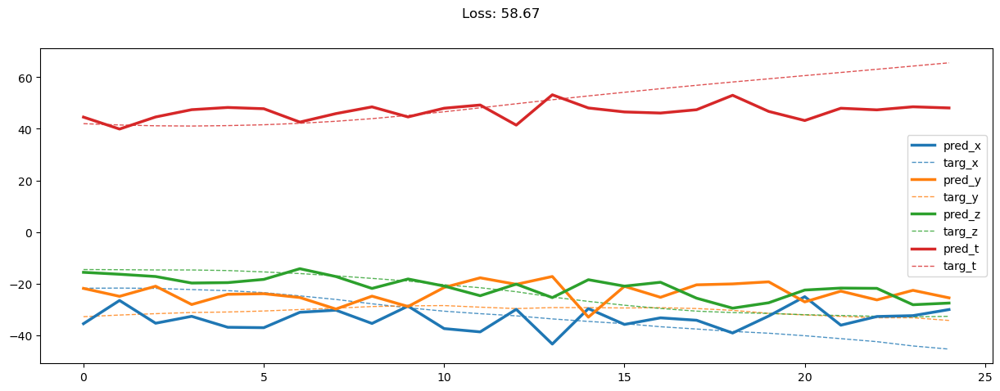

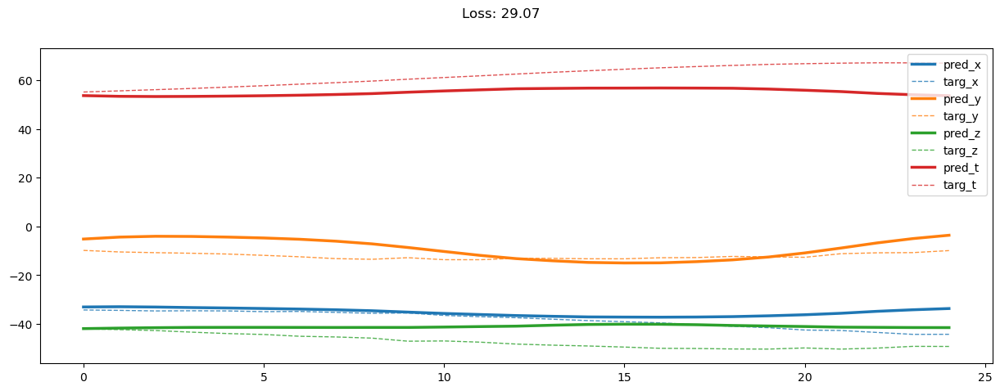

01000: train loss:  111.235, imu loss:  0.136, mag loss:  35.655, div loss:  71.311, slim:  4.775, tlim:  3.920
       valid loss:  107.784, imu loss:  0.104, mag loss:  45.217, div loss:  57.840, slim:  5.228, tlim:  4.421
01020: train loss:  109.744, imu loss:  0.136, mag loss:  35.264, div loss:  70.234, slim:  4.773, tlim:  3.888
       valid loss:  107.823, imu loss:  0.103, mag loss:  45.189, div loss:  57.912, slim:  5.235, tlim:  4.412
01040: train loss:  109.206, imu loss:  0.136, mag loss:  34.981, div loss:  69.994, slim:  4.745, tlim:  3.879
       valid loss:  108.083, imu loss:  0.103, mag loss:  45.076, div loss:  58.313, slim:  5.180, tlim:  4.394
01060: train loss:  108.355, imu loss:  0.136, mag loss:  34.639, div loss:  69.500, slim:  4.740, tlim:  3.860
       valid loss:  107.484, imu loss:  0.103, mag loss:  44.889, div loss:  57.907, slim:  5.197, tlim:  4.382
01080: train loss:  107.057, imu loss:  0.135, mag loss:  34.278, div loss:  68.561, slim:  4.741, tlim:

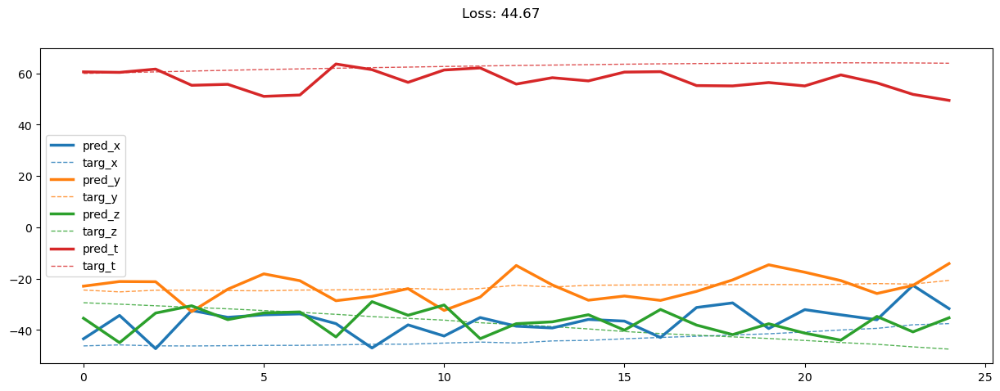

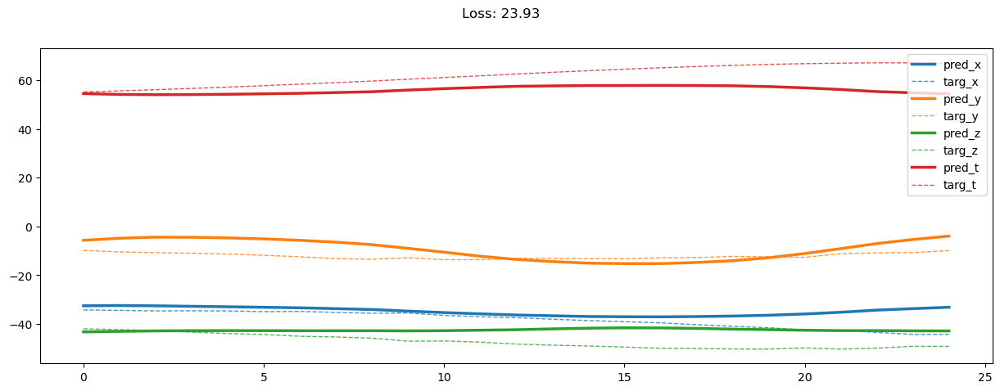

01200: train loss:  102.686, imu loss:  0.135, mag loss:  32.939, div loss:  65.606, slim:  4.693, tlim:  3.779
       valid loss:  107.675, imu loss:  0.102, mag loss:  45.429, div loss:  57.614, slim:  5.101, tlim:  4.341
01220: train loss:  102.374, imu loss:  0.135, mag loss:  32.664, div loss:  65.570, slim:  4.714, tlim:  3.769
       valid loss:  107.640, imu loss:  0.102, mag loss:  45.458, div loss:  57.519, slim:  5.125, tlim:  4.373
01240: train loss:  101.499, imu loss:  0.135, mag loss:  32.424, div loss:  64.950, slim:  4.696, tlim:  3.755
       valid loss:  107.221, imu loss:  0.102, mag loss:  44.931, div loss:  57.680, slim:  5.054, tlim:  4.327
01260: train loss:  100.985, imu loss:  0.134, mag loss:  32.382, div loss:  64.488, slim:  4.685, tlim:  3.746
       valid loss:  107.110, imu loss:  0.101, mag loss:  44.721, div loss:  57.752, slim:  5.100, tlim:  4.348
01280: train loss:  100.636, imu loss:  0.134, mag loss:  32.208, div loss:  64.310, slim:  4.707, tlim:

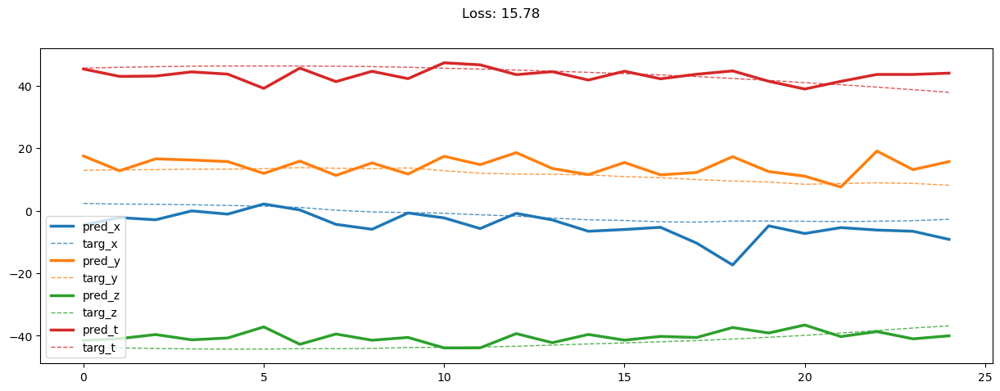

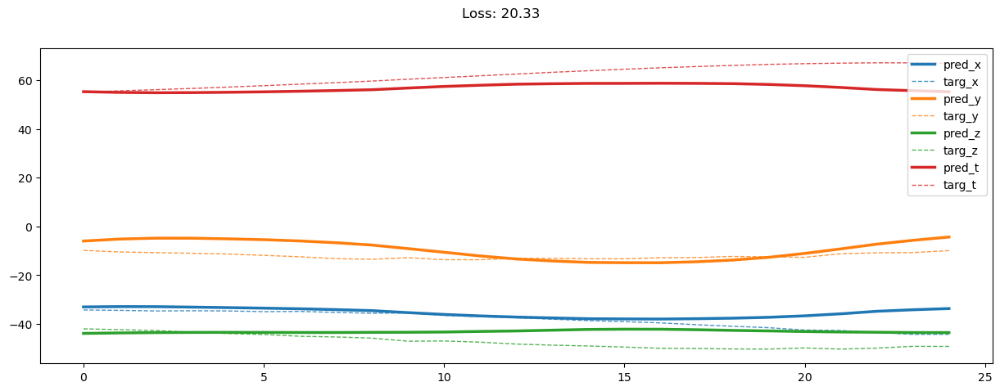

01400: train loss:  95.806, imu loss:  0.134, mag loss:  30.631, div loss:  61.125, slim:  4.652, tlim:  3.671
       valid loss:  106.084, imu loss:  0.101, mag loss:  44.237, div loss:  57.313, slim:  4.968, tlim:  4.255
01420: train loss:  96.908, imu loss:  0.134, mag loss:  30.844, div loss:  61.999, slim:  4.672, tlim:  3.684
       valid loss:  105.812, imu loss:  0.101, mag loss:  44.438, div loss:  56.732, slim:  5.121, tlim:  4.347
01440: train loss:  94.576, imu loss:  0.133, mag loss:  30.197, div loss:  60.348, slim:  4.666, tlim:  3.642
       valid loss:  106.451, imu loss:  0.101, mag loss:  44.830, div loss:  57.050, slim:  4.975, tlim:  4.302
01460: train loss:  94.377, imu loss:  0.133, mag loss:  30.258, div loss:  60.091, slim:  4.659, tlim:  3.640
       valid loss:  106.866, imu loss:  0.101, mag loss:  44.916, div loss:  57.393, slim:  4.972, tlim:  4.284
01480: train loss:  94.682, imu loss:  0.133, mag loss:  30.264, div loss:  60.379, slim:  4.656, tlim:  3.6

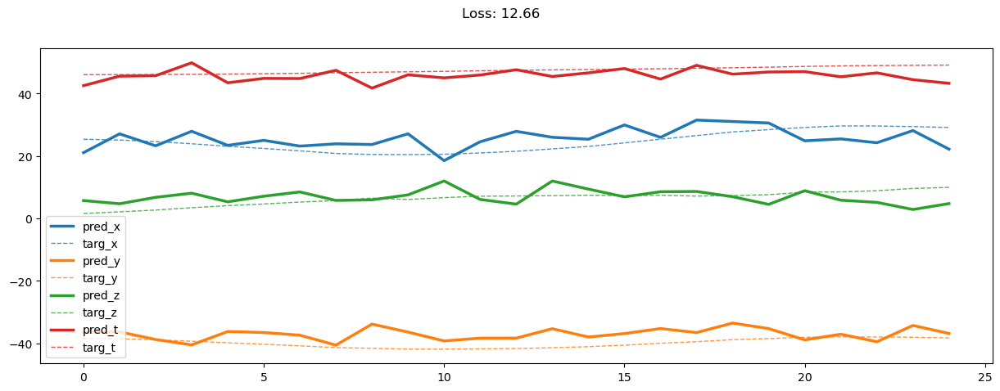

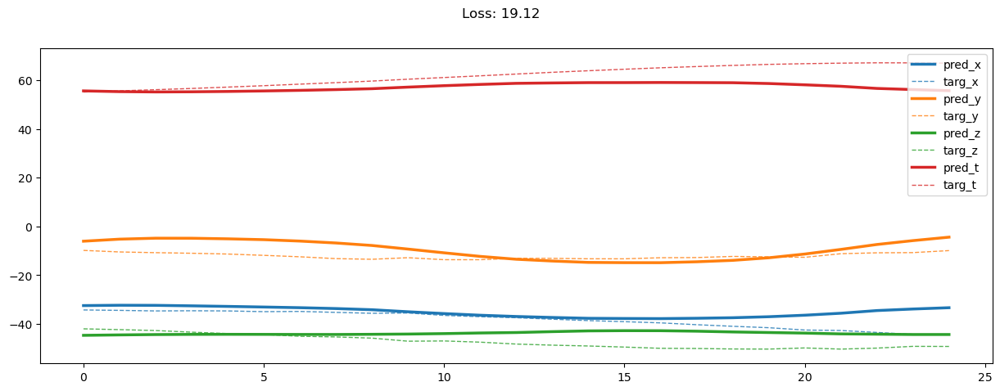

01600: train loss:  90.858, imu loss:  0.132, mag loss:  29.022, div loss:  57.870, slim:  4.634, tlim:  3.568
       valid loss:  106.220, imu loss:  0.100, mag loss:  44.614, div loss:  57.050, slim:  4.974, tlim:  4.283
01620: train loss:  90.990, imu loss:  0.133, mag loss:  28.995, div loss:  58.027, slim:  4.614, tlim:  3.576
       valid loss:  106.649, imu loss:  0.100, mag loss:  45.245, div loss:  56.897, slim:  4.925, tlim:  4.235
01640: train loss:  90.248, imu loss:  0.132, mag loss:  28.851, div loss:  57.459, slim:  4.607, tlim:  3.539
       valid loss:  106.726, imu loss:  0.100, mag loss:  45.213, div loss:  56.911, slim:  5.043, tlim:  4.322
01660: train loss:  90.712, imu loss:  0.132, mag loss:  28.724, div loss:  58.048, slim:  4.608, tlim:  3.541
       valid loss:  106.704, imu loss:  0.100, mag loss:  44.972, div loss:  57.191, slim:  4.952, tlim:  4.271
01680: train loss:  89.511, imu loss:  0.132, mag loss:  28.557, div loss:  57.024, slim:  4.599, tlim:  3.5

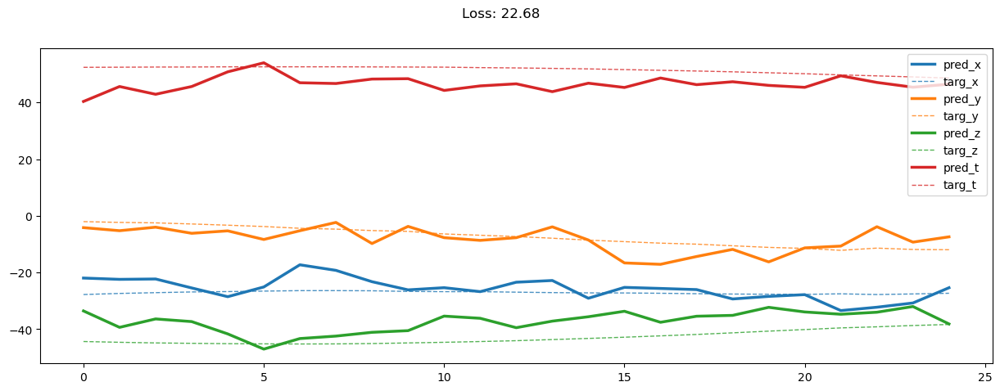

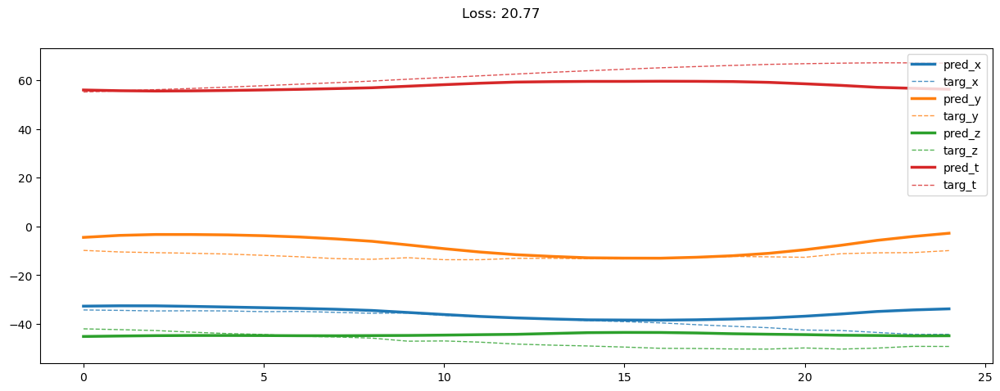

01800: train loss:  87.093, imu loss:  0.132, mag loss:  27.672, div loss:  55.513, slim:  4.602, tlim:  3.501
       valid loss:  106.730, imu loss:  0.100, mag loss:  45.048, div loss:  57.145, slim:  4.956, tlim:  4.265
01820: train loss:  85.997, imu loss:  0.132, mag loss:  27.443, div loss:  54.658, slim:  4.616, tlim:  3.482
       valid loss:  106.521, imu loss:  0.099, mag loss:  44.945, div loss:  57.064, slim:  4.896, tlim:  4.251
01840: train loss:  86.187, imu loss:  0.132, mag loss:  27.443, div loss:  54.855, slim:  4.593, tlim:  3.479
       valid loss:  106.013, imu loss:  0.099, mag loss:  44.774, div loss:  56.698, slim:  4.959, tlim:  4.269
01860: train loss:  85.161, imu loss:  0.132, mag loss:  27.266, div loss:  54.012, slim:  4.593, tlim:  3.471
       valid loss:  106.905, imu loss:  0.099, mag loss:  45.173, div loss:  57.195, slim:  4.949, tlim:  4.268
01880: train loss:  85.585, imu loss:  0.132, mag loss:  27.215, div loss:  54.492, slim:  4.603, tlim:  3.4

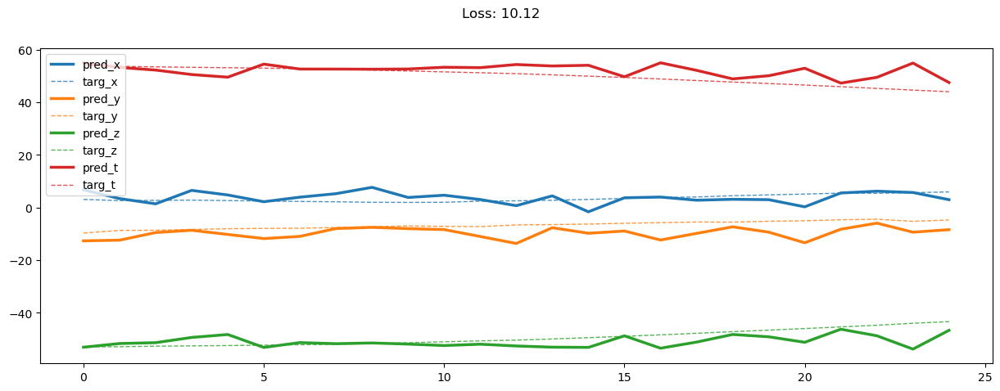

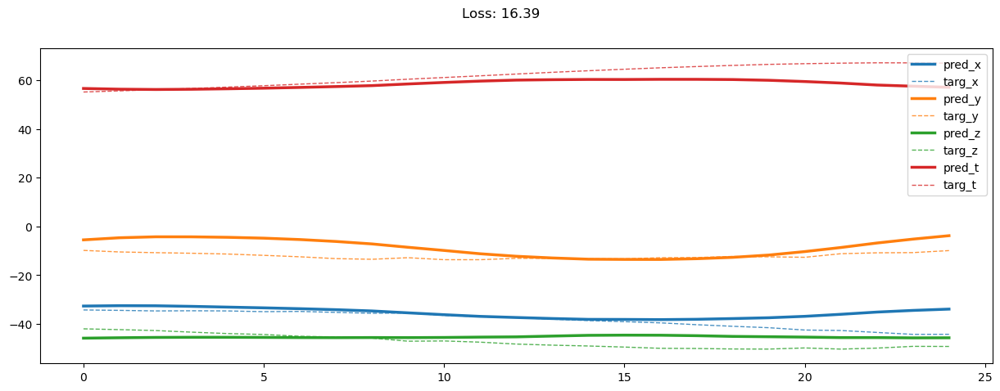

02000: train loss:  83.305, imu loss:  0.131, mag loss:  26.491, div loss:  52.956, slim:  4.597, tlim:  3.437
       valid loss:  106.816, imu loss:  0.099, mag loss:  45.168, div loss:  57.148, slim:  4.880, tlim:  4.243
02020: train loss:  82.981, imu loss:  0.131, mag loss:  26.415, div loss:  52.715, slim:  4.612, tlim:  3.422
       valid loss:  107.253, imu loss:  0.099, mag loss:  45.252, div loss:  57.510, slim:  4.890, tlim:  4.228
02040: train loss:  82.842, imu loss:  0.132, mag loss:  26.349, div loss:  52.651, slim:  4.589, tlim:  3.418
       valid loss:  106.660, imu loss:  0.099, mag loss:  44.944, div loss:  57.243, slim:  4.862, tlim:  4.211
02060: train loss:  82.107, imu loss:  0.131, mag loss:  26.139, div loss:  52.133, slim:  4.596, tlim:  3.407
       valid loss:  106.529, imu loss:  0.099, mag loss:  45.056, div loss:  56.974, slim:  4.900, tlim:  4.233
02080: train loss:  81.899, imu loss:  0.131, mag loss:  26.106, div loss:  51.954, slim:  4.616, tlim:  3.4

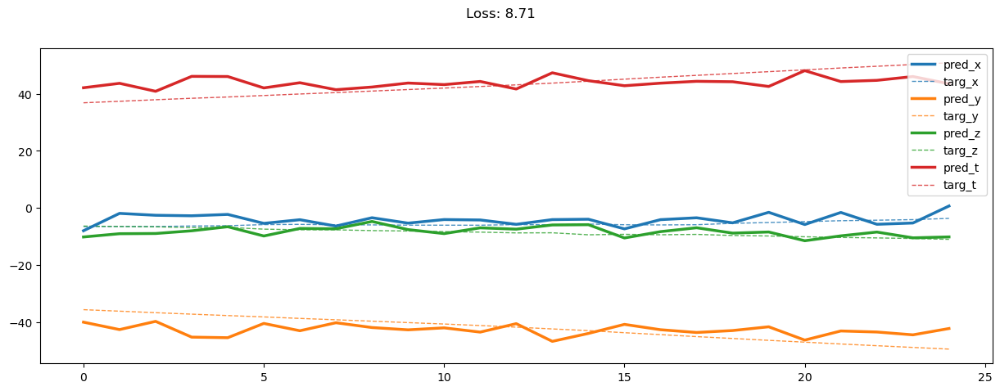

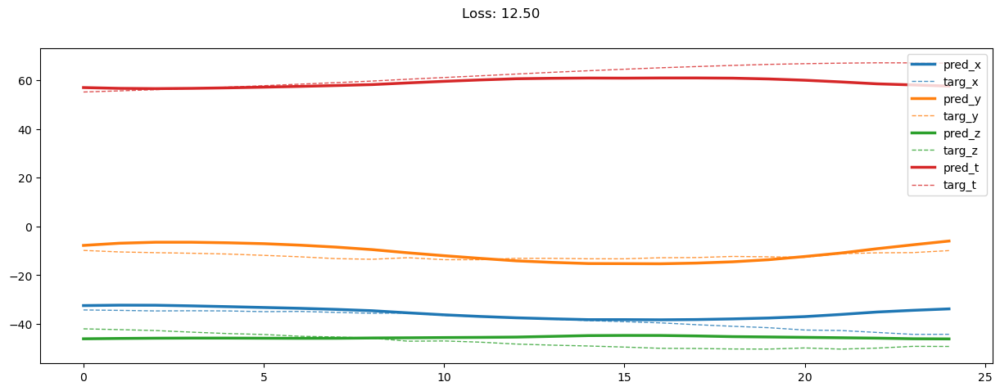

02200: train loss:  79.957, imu loss:  0.131, mag loss:  25.359, div loss:  50.791, slim:  4.582, tlim:  3.374
       valid loss:  106.538, imu loss:  0.098, mag loss:  44.934, div loss:  57.146, slim:  4.853, tlim:  4.195
02220: train loss:  79.724, imu loss:  0.131, mag loss:  25.298, div loss:  50.633, slim:  4.589, tlim:  3.354
       valid loss:  106.733, imu loss:  0.098, mag loss:  45.198, div loss:  57.083, slim:  4.832, tlim:  4.194
02240: train loss:  78.977, imu loss:  0.131, mag loss:  25.121, div loss:  50.081, slim:  4.555, tlim:  3.340
       valid loss:  107.251, imu loss:  0.098, mag loss:  45.347, div loss:  57.403, slim:  4.868, tlim:  4.247
02260: train loss:  79.152, imu loss:  0.132, mag loss:  25.059, div loss:  50.317, slim:  4.576, tlim:  3.335
       valid loss:  107.209, imu loss:  0.098, mag loss:  45.452, div loss:  57.291, slim:  4.845, tlim:  4.208
02280: train loss:  78.335, imu loss:  0.131, mag loss:  24.886, div loss:  49.669, slim:  4.578, tlim:  3.3

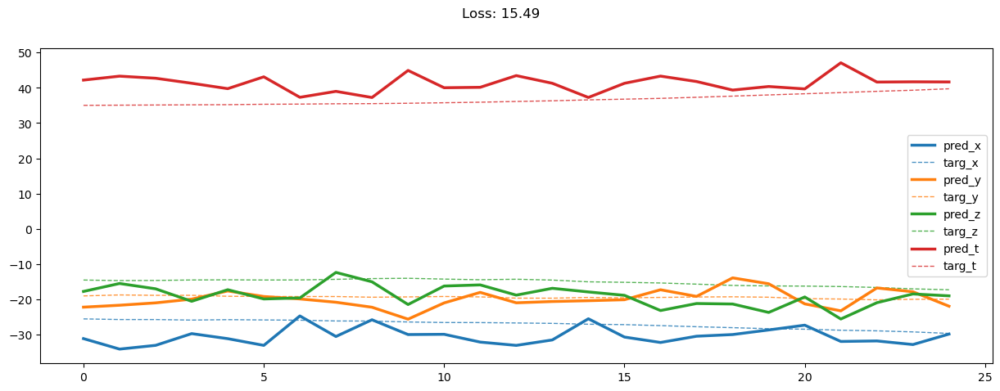

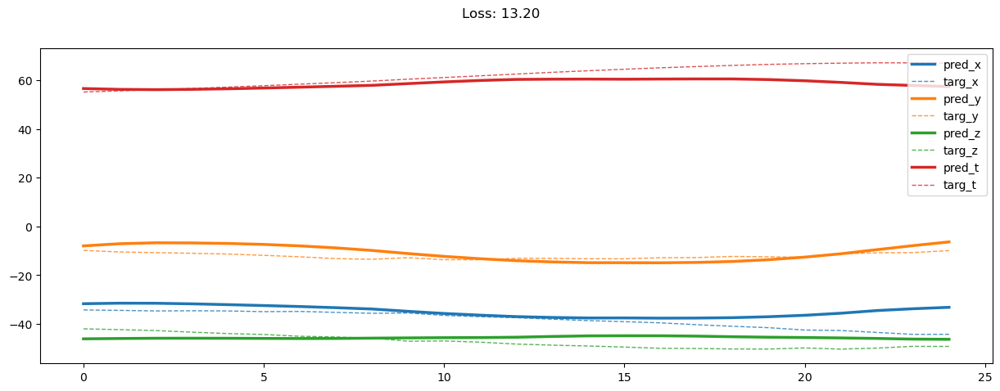

02400: train loss:  77.158, imu loss:  0.130, mag loss:  24.335, div loss:  49.087, slim:  4.569, tlim:  3.286
       valid loss:  107.356, imu loss:  0.098, mag loss:  45.595, div loss:  57.297, slim:  4.793, tlim:  4.224
02420: train loss:  76.666, imu loss:  0.130, mag loss:  24.308, div loss:  48.626, slim:  4.556, tlim:  3.284
       valid loss:  107.019, imu loss:  0.098, mag loss:  45.431, div loss:  57.092, slim:  4.870, tlim:  4.240
02440: train loss:  76.008, imu loss:  0.130, mag loss:  24.204, div loss:  48.065, slim:  4.580, tlim:  3.284
       valid loss:  108.061, imu loss:  0.098, mag loss:  46.163, div loss:  57.425, slim:  4.826, tlim:  4.223
02460: train loss:  76.932, imu loss:  0.130, mag loss:  24.356, div loss:  48.828, slim:  4.563, tlim:  3.303
       valid loss:  107.469, imu loss:  0.098, mag loss:  45.792, div loss:  57.189, slim:  4.849, tlim:  4.236
02480: train loss:  76.313, imu loss:  0.131, mag loss:  24.201, div loss:  48.372, slim:  4.595, tlim:  3.2

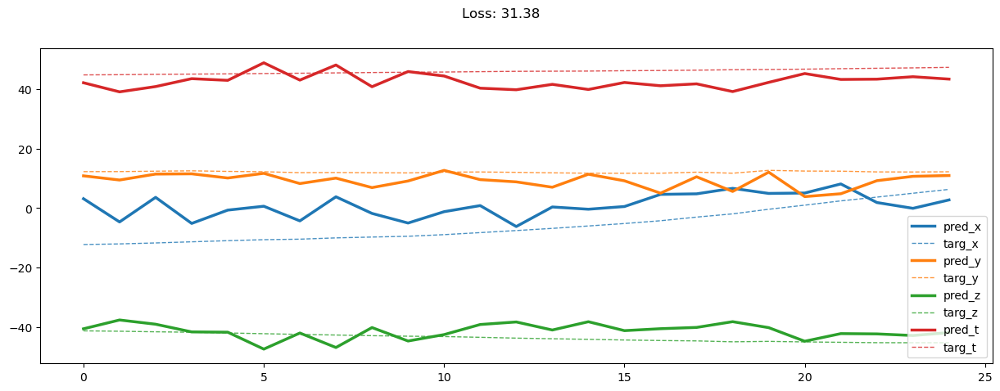

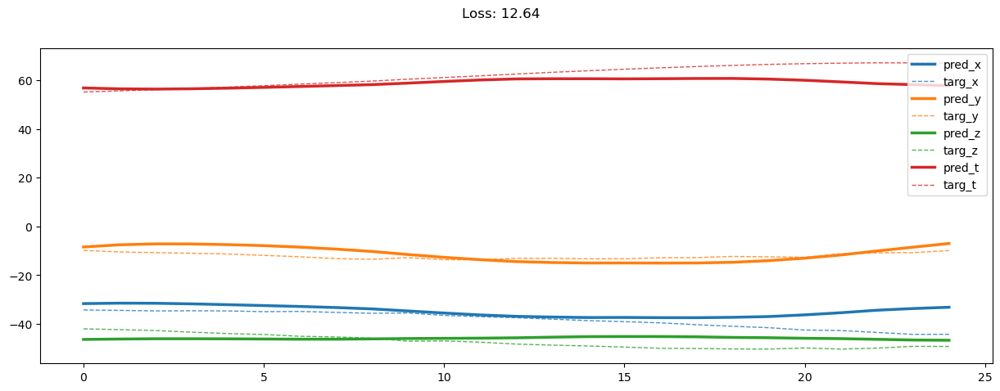

02600: train loss:  74.595, imu loss:  0.130, mag loss:  23.603, div loss:  47.287, slim:  4.540, tlim:  3.253
       valid loss:  107.611, imu loss:  0.098, mag loss:  45.873, div loss:  57.256, slim:  4.808, tlim:  4.243
02620: train loss:  74.050, imu loss:  0.131, mag loss:  23.456, div loss:  46.892, slim:  4.549, tlim:  3.245
       valid loss:  107.253, imu loss:  0.098, mag loss:  45.646, div loss:  57.158, slim:  4.784, tlim:  4.207
02640: train loss:  74.210, imu loss:  0.130, mag loss:  23.529, div loss:  46.978, slim:  4.584, tlim:  3.236
       valid loss:  107.425, imu loss:  0.098, mag loss:  45.587, div loss:  57.382, slim:  4.794, tlim:  4.213
02660: train loss:  73.816, imu loss:  0.130, mag loss:  23.375, div loss:  46.749, slim:  4.571, tlim:  3.227
       valid loss:  107.534, imu loss:  0.098, mag loss:  45.711, div loss:  57.358, slim:  4.828, tlim:  4.214
02680: train loss:  73.438, imu loss:  0.129, mag loss:  23.237, div loss:  46.508, slim:  4.583, tlim:  3.2

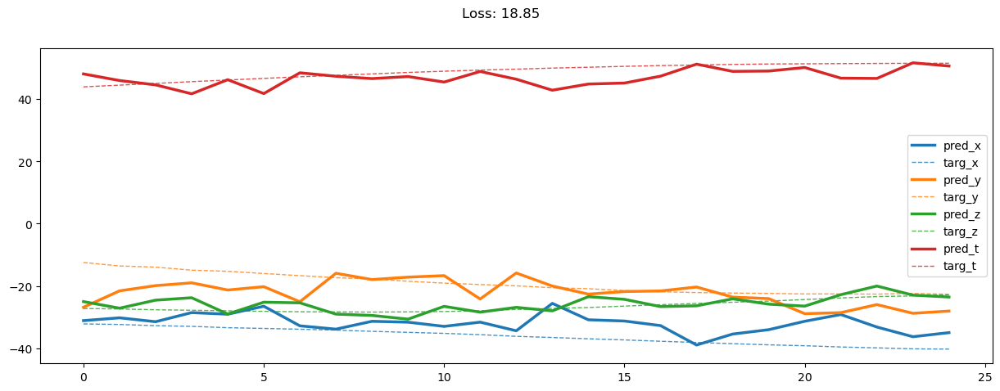

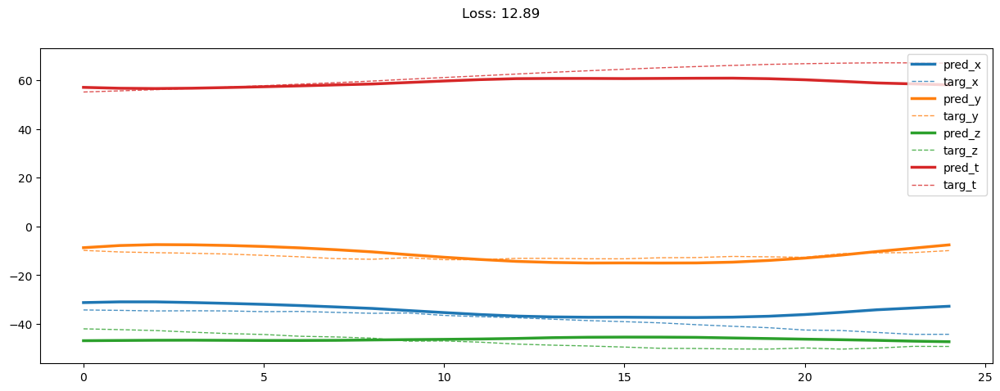

02800: train loss:  72.160, imu loss:  0.130, mag loss:  22.832, div loss:  45.655, slim:  4.565, tlim:  3.203
       valid loss:  108.191, imu loss:  0.097, mag loss:  46.540, div loss:  57.156, slim:  4.841, tlim:  4.249
02820: train loss:  71.805, imu loss:  0.129, mag loss:  22.670, div loss:  45.466, slim:  4.583, tlim:  3.193
       valid loss:  108.927, imu loss:  0.097, mag loss:  46.522, div loss:  57.975, slim:  4.750, tlim:  4.195
02840: train loss:  71.183, imu loss:  0.129, mag loss:  22.552, div loss:  44.984, slim:  4.540, tlim:  3.178
       valid loss:  108.476, imu loss:  0.097, mag loss:  46.325, div loss:  57.702, slim:  4.780, tlim:  4.210
02860: train loss:  71.360, imu loss:  0.129, mag loss:  22.556, div loss:  45.155, slim:  4.535, tlim:  3.181
       valid loss:  107.706, imu loss:  0.097, mag loss:  45.805, div loss:  57.463, slim:  4.762, tlim:  4.201
02880: train loss:  71.282, imu loss:  0.129, mag loss:  22.596, div loss:  45.036, slim:  4.541, tlim:  3.1

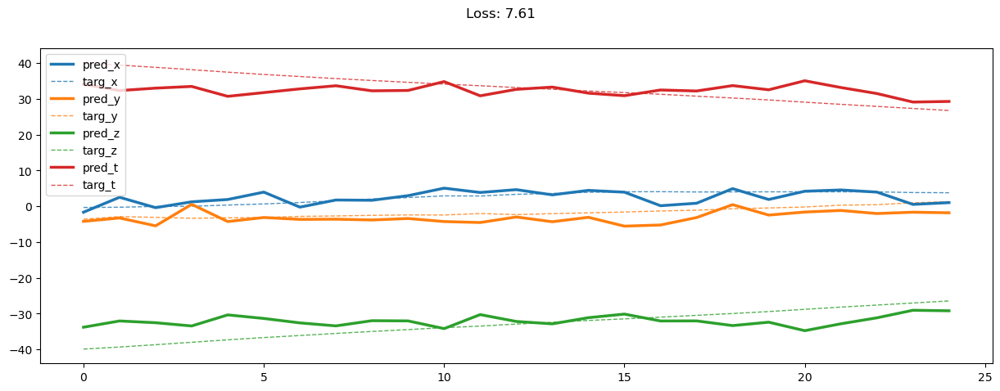

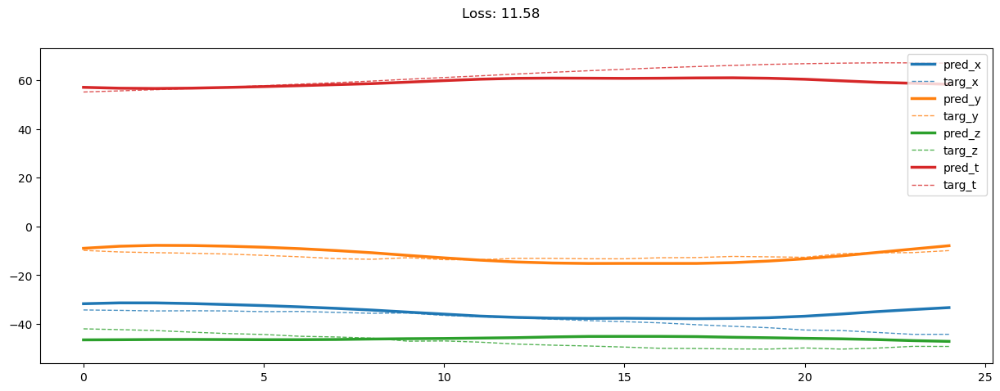

03000: train loss:  70.087, imu loss:  0.128, mag loss:  22.165, div loss:  44.286, slim:  4.576, tlim:  3.153
       valid loss:  108.021, imu loss:  0.097, mag loss:  45.980, div loss:  57.589, slim:  4.802, tlim:  4.206
03020: train loss:  69.399, imu loss:  0.129, mag loss:  21.997, div loss:  43.776, slim:  4.574, tlim:  3.137
       valid loss:  108.895, imu loss:  0.097, mag loss:  46.801, div loss:  57.657, slim:  4.746, tlim:  4.206
03040: train loss:  69.167, imu loss:  0.129, mag loss:  21.830, div loss:  43.718, slim:  4.546, tlim:  3.139
       valid loss:  108.533, imu loss:  0.097, mag loss:  46.275, div loss:  57.812, slim:  4.767, tlim:  4.210
03060: train loss:  69.777, imu loss:  0.129, mag loss:  21.997, div loss:  44.150, slim:  4.574, tlim:  3.143
       valid loss:  108.722, imu loss:  0.097, mag loss:  46.605, div loss:  57.679, slim:  4.759, tlim:  4.201
03080: train loss:  69.092, imu loss:  0.128, mag loss:  21.845, div loss:  43.625, slim:  4.585, tlim:  3.1

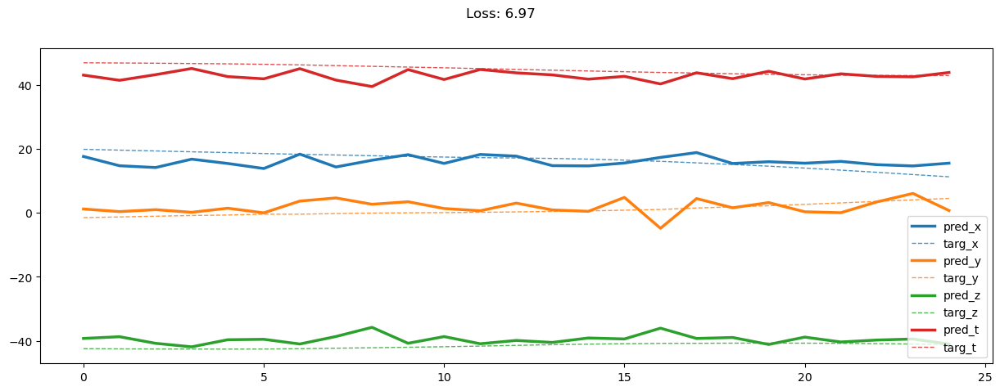

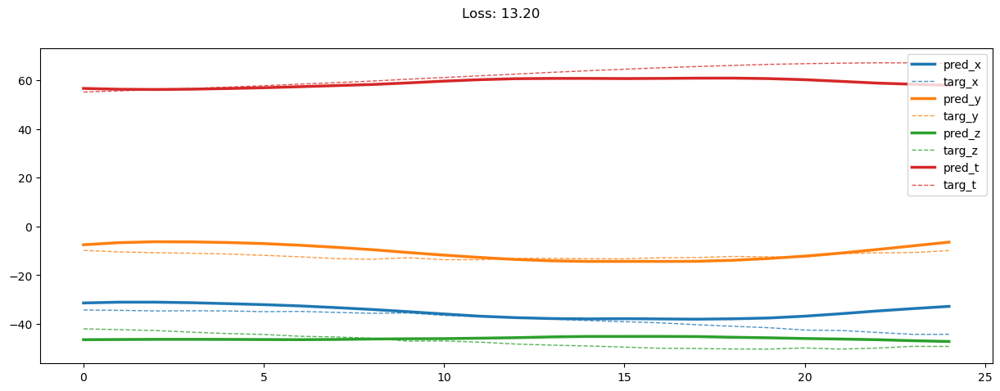

03200: train loss:  67.846, imu loss:  0.128, mag loss:  21.388, div loss:  42.865, slim:  4.544, tlim:  3.106
       valid loss:  108.650, imu loss:  0.096, mag loss:  46.508, div loss:  57.704, slim:  4.737, tlim:  4.211
03220: train loss:  67.397, imu loss:  0.128, mag loss:  21.295, div loss:  42.510, slim:  4.554, tlim:  3.101
       valid loss:  108.609, imu loss:  0.096, mag loss:  46.387, div loss:  57.790, slim:  4.758, tlim:  4.195
03240: train loss:  67.541, imu loss:  0.128, mag loss:  21.337, div loss:  42.616, slim:  4.539, tlim:  3.100
       valid loss:  108.942, imu loss:  0.096, mag loss:  46.704, div loss:  57.786, slim:  4.768, tlim:  4.219
03260: train loss:  67.093, imu loss:  0.128, mag loss:  21.264, div loss:  42.239, slim:  4.555, tlim:  3.097
       valid loss:  109.031, imu loss:  0.096, mag loss:  46.627, div loss:  57.966, slim:  4.752, tlim:  4.205
03280: train loss:  67.122, imu loss:  0.129, mag loss:  21.147, div loss:  42.383, slim:  4.550, tlim:  3.1

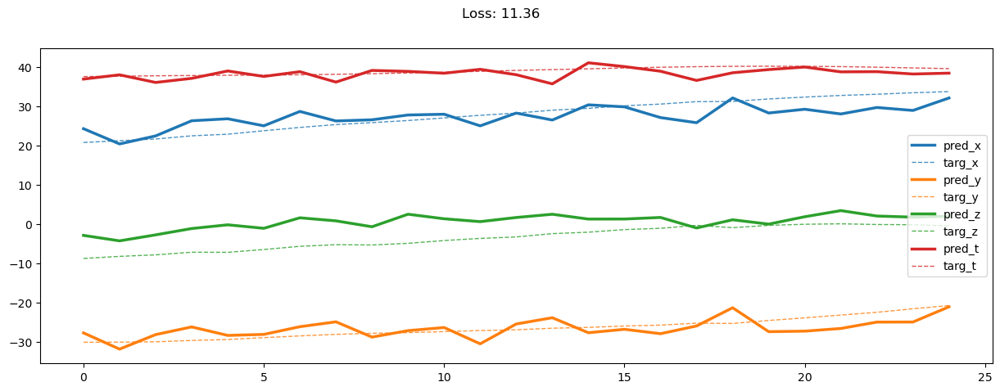

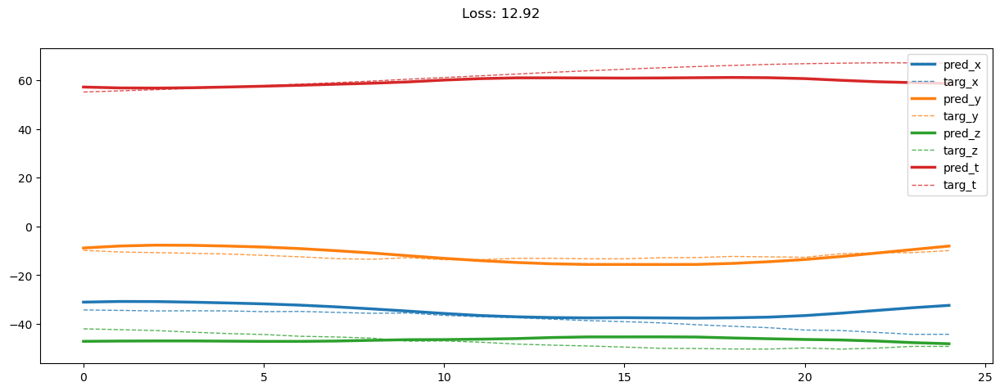

03400: train loss:  65.722, imu loss:  0.128, mag loss:  20.793, div loss:  41.362, slim:  4.561, tlim:  3.065
       valid loss:  108.947, imu loss:  0.096, mag loss:  46.687, div loss:  57.866, slim:  4.701, tlim:  4.164
03420: train loss:  66.089, imu loss:  0.128, mag loss:  20.823, div loss:  41.692, slim:  4.556, tlim:  3.077
       valid loss:  109.005, imu loss:  0.096, mag loss:  46.487, div loss:  58.112, slim:  4.715, tlim:  4.174
03440: train loss:  65.560, imu loss:  0.128, mag loss:  20.679, div loss:  41.319, slim:  4.589, tlim:  3.051
       valid loss:  108.946, imu loss:  0.096, mag loss:  46.861, div loss:  57.639, slim:  4.761, tlim:  4.212
03460: train loss:  64.816, imu loss:  0.128, mag loss:  20.512, div loss:  40.756, slim:  4.553, tlim:  3.044
       valid loss:  109.070, imu loss:  0.096, mag loss:  46.679, div loss:  57.938, slim:  4.761, tlim:  4.222
03480: train loss:  64.823, imu loss:  0.128, mag loss:  20.453, div loss:  40.818, slim:  4.562, tlim:  3.0

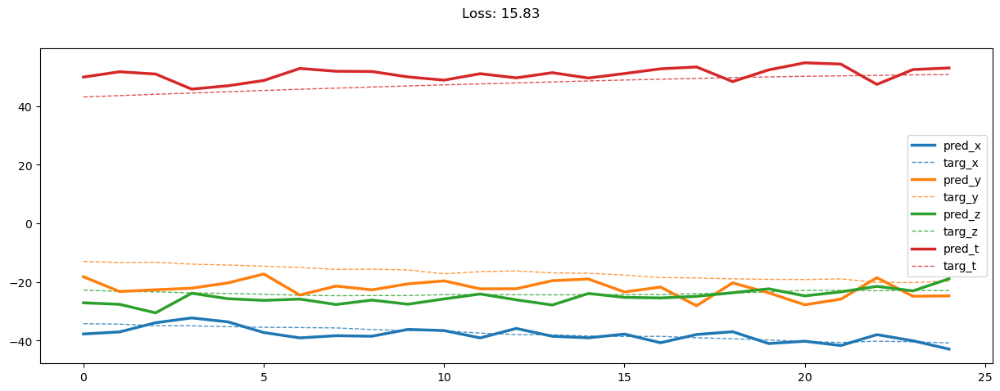

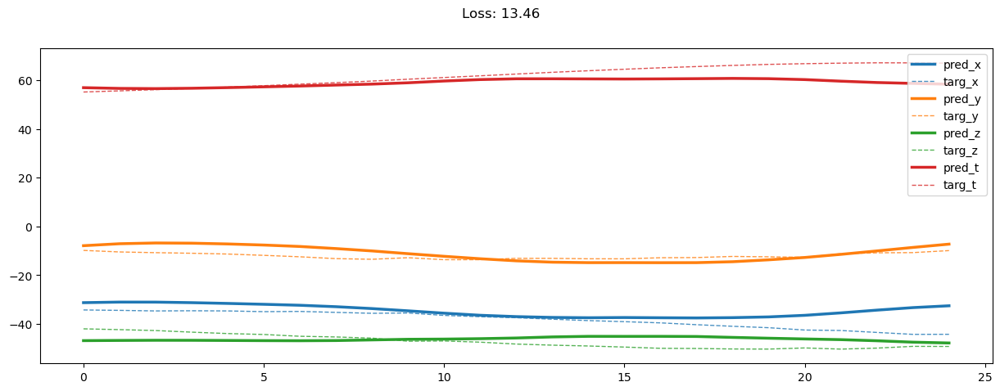

03600: train loss:  63.878, imu loss:  0.128, mag loss:  20.145, div loss:  40.210, slim:  4.546, tlim:  3.013
       valid loss:  109.656, imu loss:  0.096, mag loss:  46.944, div loss:  58.310, slim:  4.730, tlim:  4.166
03620: train loss:  64.065, imu loss:  0.127, mag loss:  20.152, div loss:  40.383, slim:  4.563, tlim:  3.015
       valid loss:  110.207, imu loss:  0.096, mag loss:  47.550, div loss:  58.237, slim:  4.721, tlim:  4.192
03640: train loss:  63.598, imu loss:  0.127, mag loss:  20.008, div loss:  40.073, slim:  4.551, tlim:  3.002
       valid loss:  109.968, imu loss:  0.096, mag loss:  46.950, div loss:  58.609, slim:  4.748, tlim:  4.169
03660: train loss:  63.559, imu loss:  0.127, mag loss:  20.021, div loss:  40.017, slim:  4.566, tlim:  3.002
       valid loss:  109.681, imu loss:  0.096, mag loss:  46.968, div loss:  58.313, slim:  4.694, tlim:  4.175
03680: train loss:  63.987, imu loss:  0.128, mag loss:  20.179, div loss:  40.278, slim:  4.570, tlim:  3.0

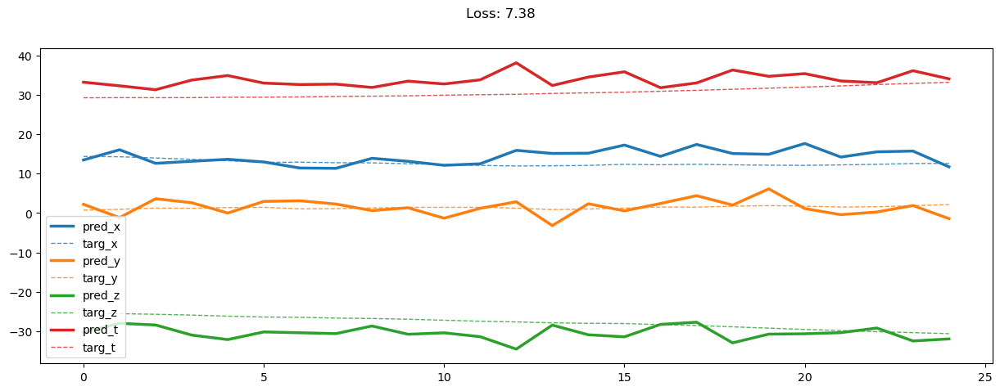

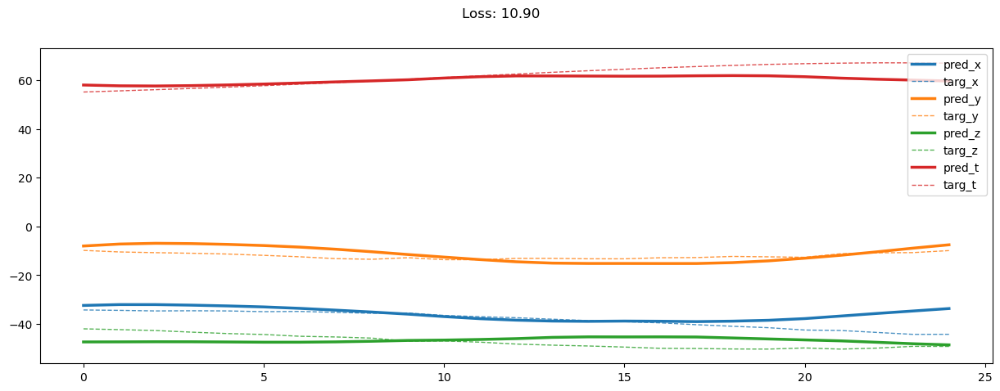

03800: train loss:  62.356, imu loss:  0.127, mag loss:  19.654, div loss:  39.195, slim:  4.575, tlim:  2.981
       valid loss:  109.677, imu loss:  0.095, mag loss:  46.800, div loss:  58.490, slim:  4.682, tlim:  4.162
03820: train loss:  62.306, imu loss:  0.127, mag loss:  19.629, div loss:  39.175, slim:  4.571, tlim:  2.975
       valid loss:  110.778, imu loss:  0.095, mag loss:  47.799, div loss:  58.572, slim:  4.712, tlim:  4.178
03840: train loss:  62.492, imu loss:  0.128, mag loss:  19.629, div loss:  39.367, slim:  4.568, tlim:  2.969
       valid loss:  109.871, imu loss:  0.095, mag loss:  47.005, div loss:  58.449, slim:  4.748, tlim:  4.179
03860: train loss:  61.863, imu loss:  0.127, mag loss:  19.444, div loss:  38.922, slim:  4.567, tlim:  2.970
       valid loss:  109.692, imu loss:  0.095, mag loss:  46.691, div loss:  58.575, slim:  4.752, tlim:  4.192
03880: train loss:  61.925, imu loss:  0.127, mag loss:  19.447, div loss:  38.985, slim:  4.560, tlim:  2.9

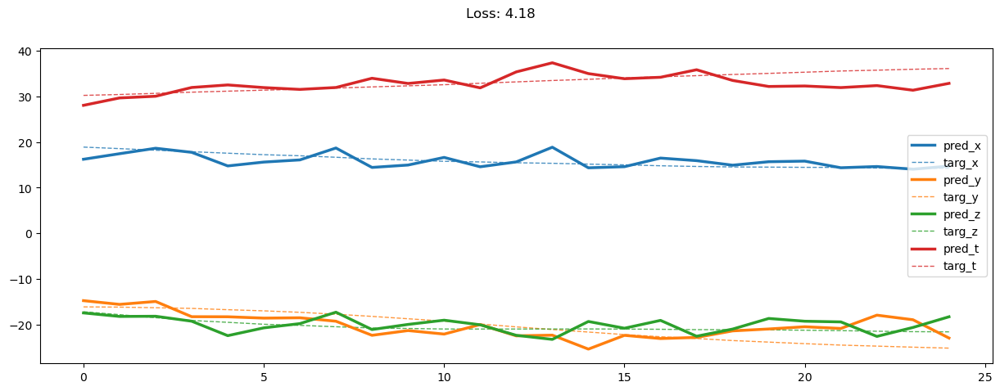

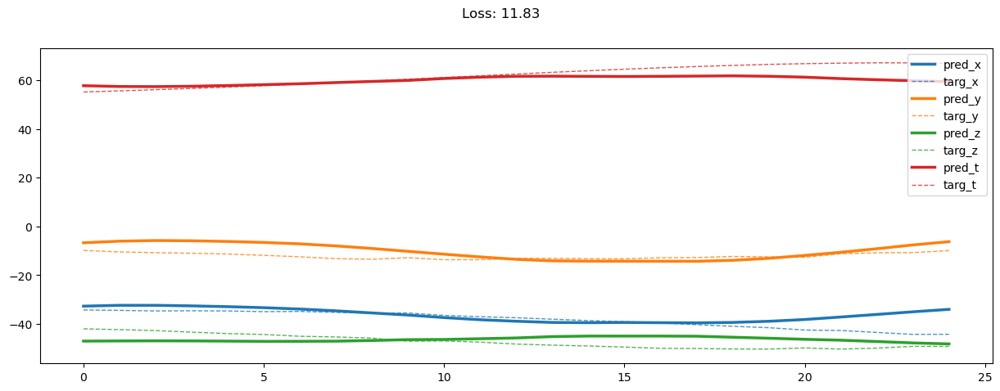

04000: train loss:  61.161, imu loss:  0.126, mag loss:  19.226, div loss:  38.461, slim:  4.552, tlim:  2.947
       valid loss:  110.448, imu loss:  0.095, mag loss:  46.934, div loss:  59.142, slim:  4.705, tlim:  4.134
04020: train loss:  60.818, imu loss:  0.127, mag loss:  19.107, div loss:  38.230, slim:  4.575, tlim:  2.947
       valid loss:  110.375, imu loss:  0.095, mag loss:  47.405, div loss:  58.565, slim:  4.738, tlim:  4.167
04040: train loss:  60.749, imu loss:  0.126, mag loss:  19.124, div loss:  38.142, slim:  4.572, tlim:  2.953
       valid loss:  111.013, imu loss:  0.095, mag loss:  47.588, div loss:  59.041, slim:  4.673, tlim:  4.161
04060: train loss:  60.651, imu loss:  0.127, mag loss:  19.124, div loss:  38.059, slim:  4.568, tlim:  2.932
       valid loss:  110.831, imu loss:  0.095, mag loss:  47.534, div loss:  58.918, slim:  4.676, tlim:  4.153
04080: train loss:  60.794, imu loss:  0.127, mag loss:  19.057, div loss:  38.262, slim:  4.576, tlim:  2.9

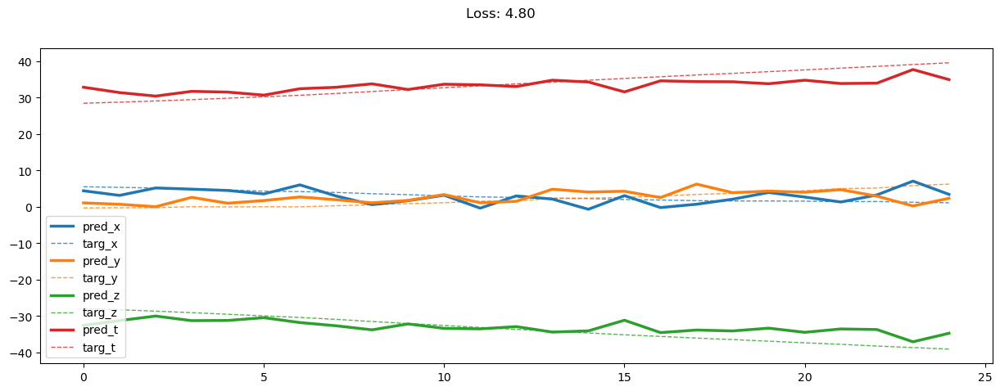

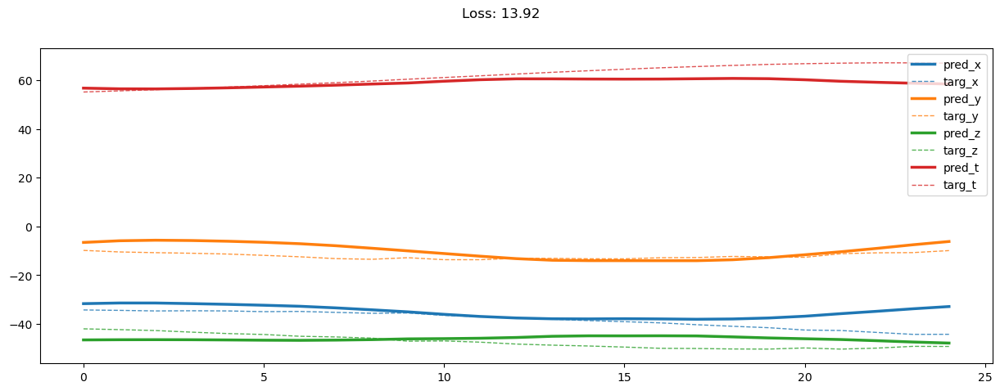

04200: train loss:  59.446, imu loss:  0.127, mag loss:  18.726, div loss:  37.270, slim:  4.566, tlim:  2.910
       valid loss:  110.489, imu loss:  0.095, mag loss:  47.209, div loss:  58.901, slim:  4.707, tlim:  4.144
04220: train loss:  59.595, imu loss:  0.127, mag loss:  18.735, div loss:  37.411, slim:  4.542, tlim:  2.916
       valid loss:  110.713, imu loss:  0.095, mag loss:  47.079, div loss:  59.245, slim:  4.699, tlim:  4.161
04480: train loss:  57.167, imu loss:  0.126, mag loss:  17.906, div loss:  35.861, slim:  4.572, tlim:  2.843
       valid loss:  111.718, imu loss:  0.094, mag loss:  47.597, div loss:  59.755, slim:  4.718, tlim:  4.123
04500: train loss:  57.710, imu loss:  0.127, mag loss:  18.037, div loss:  36.262, slim:  4.564, tlim:  2.858
       valid loss:  111.763, imu loss:  0.094, mag loss:  47.730, div loss:  59.643, slim:  4.716, tlim:  4.156
05160: train loss:  53.709, imu loss:  0.125, mag loss:  16.833, div loss:  33.537, slim:  4.565, tlim:  2.7

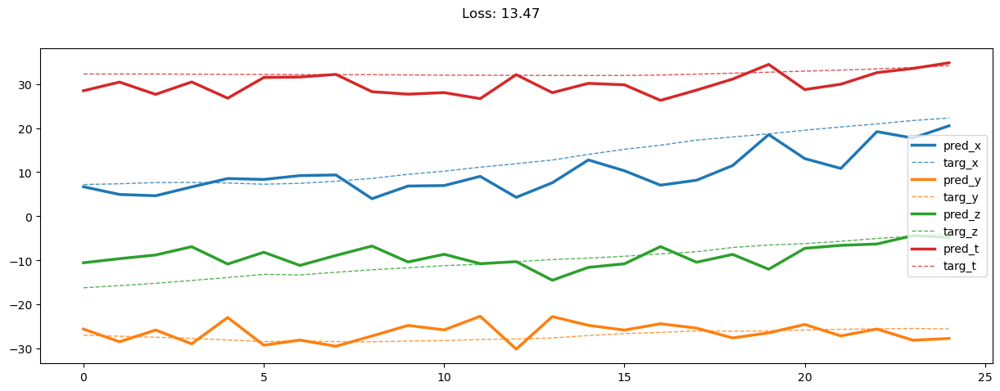

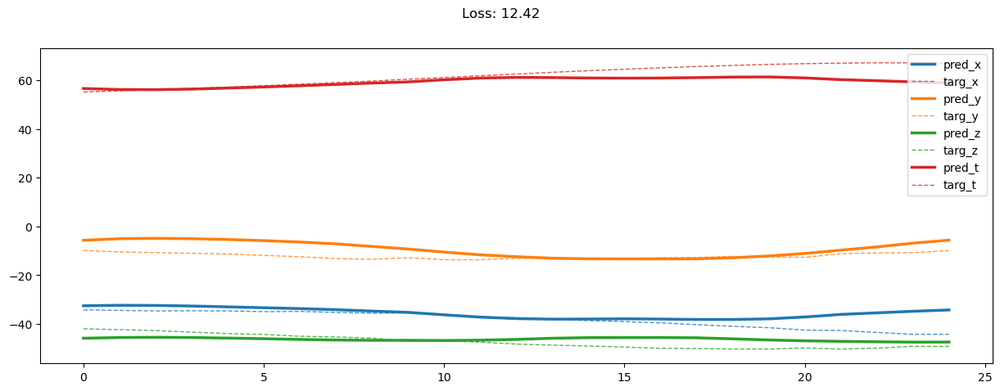

05200: train loss:  53.408, imu loss:  0.125, mag loss:  16.687, div loss:  33.401, slim:  4.561, tlim:  2.740
       valid loss:  112.426, imu loss:  0.094, mag loss:  47.693, div loss:  60.356, slim:  4.683, tlim:  4.151
05220: train loss:  53.124, imu loss:  0.125, mag loss:  16.617, div loss:  33.179, slim:  4.547, tlim:  2.754
       valid loss:  112.475, imu loss:  0.094, mag loss:  47.655, div loss:  60.446, slim:  4.693, tlim:  4.141
05240: train loss:  53.393, imu loss:  0.126, mag loss:  16.698, div loss:  33.361, slim:  4.564, tlim:  2.756
       valid loss:  112.568, imu loss:  0.094, mag loss:  47.753, div loss:  60.438, slim:  4.684, tlim:  4.149
05260: train loss:  53.498, imu loss:  0.125, mag loss:  16.665, div loss:  33.512, slim:  4.564, tlim:  2.739
       valid loss:  112.338, imu loss:  0.094, mag loss:  47.648, div loss:  60.312, slim:  4.686, tlim:  4.152
05280: train loss:  53.018, imu loss:  0.126, mag loss:  16.614, div loss:  33.090, slim:  4.560, tlim:  2.7

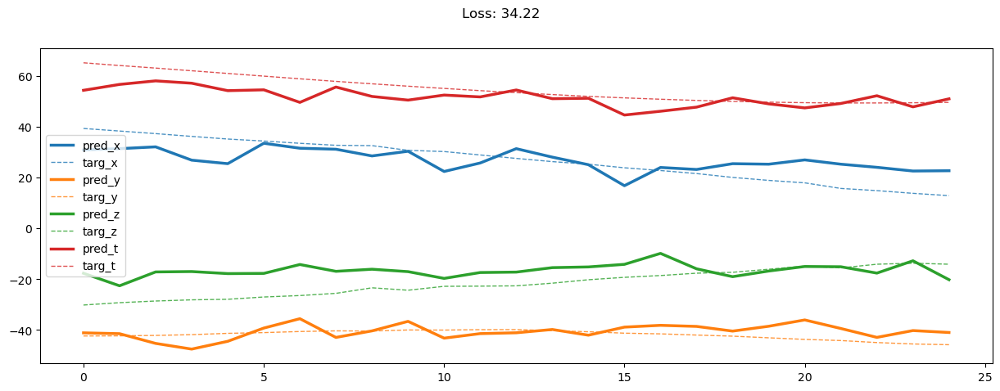

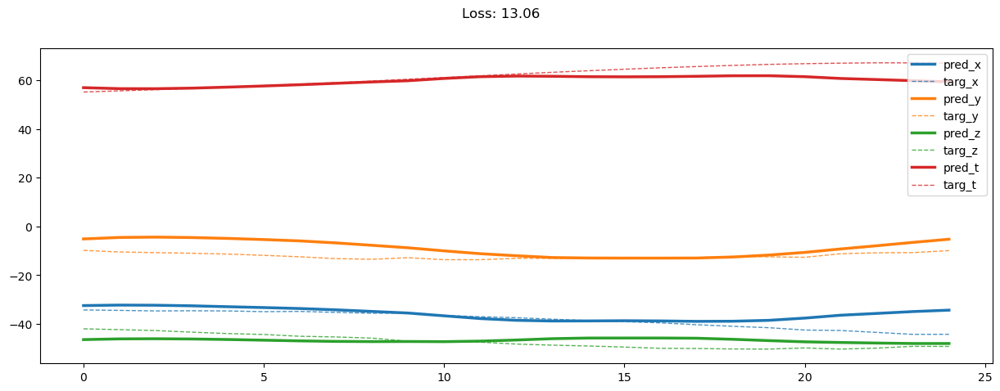

05400: train loss:  52.379, imu loss:  0.125, mag loss:  16.375, div loss:  32.698, slim:  4.579, tlim:  2.715
       valid loss:  113.329, imu loss:  0.094, mag loss:  48.381, div loss:  60.561, slim:  4.689, tlim:  4.162
05420: train loss:  52.240, imu loss:  0.124, mag loss:  16.371, div loss:  32.569, slim:  4.558, tlim:  2.716
       valid loss:  113.227, imu loss:  0.094, mag loss:  48.295, div loss:  60.562, slim:  4.684, tlim:  4.141
05440: train loss:  52.292, imu loss:  0.125, mag loss:  16.324, div loss:  32.665, slim:  4.560, tlim:  2.717
       valid loss:  112.851, imu loss:  0.094, mag loss:  47.940, div loss:  60.520, slim:  4.681, tlim:  4.169
05460: train loss:  51.937, imu loss:  0.126, mag loss:  16.256, div loss:  32.387, slim:  4.559, tlim:  2.705
       valid loss:  113.672, imu loss:  0.094, mag loss:  48.532, div loss:  60.760, slim:  4.682, tlim:  4.153
05480: train loss:  52.139, imu loss:  0.125, mag loss:  16.305, div loss:  32.543, slim:  4.544, tlim:  2.7

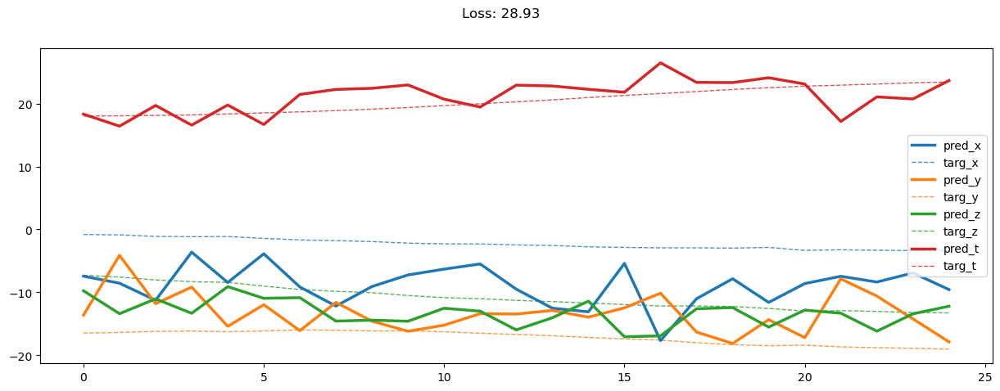

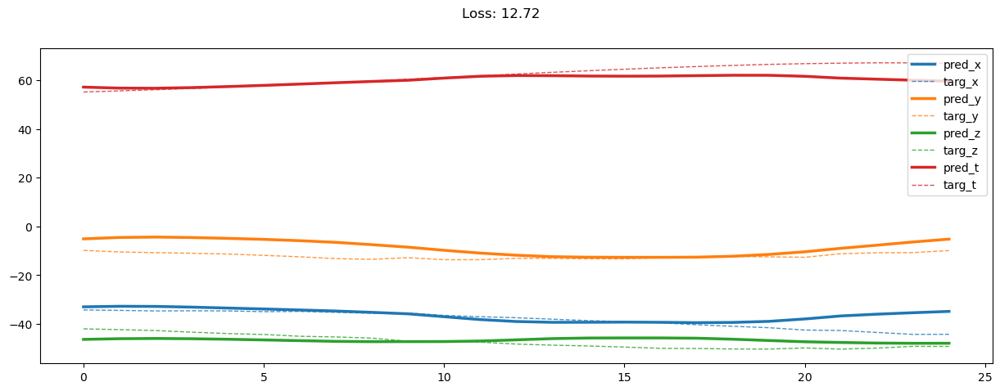

05600: train loss:  51.565, imu loss:  0.126, mag loss:  16.103, div loss:  32.175, slim:  4.578, tlim:  2.688
       valid loss:  113.207, imu loss:  0.094, mag loss:  47.857, div loss:  60.971, slim:  4.678, tlim:  4.154
05620: train loss:  51.184, imu loss:  0.124, mag loss:  15.975, div loss:  31.925, slim:  4.576, tlim:  2.687
       valid loss:  113.636, imu loss:  0.094, mag loss:  47.985, div loss:  61.274, slim:  4.668, tlim:  4.156
05640: train loss:  51.302, imu loss:  0.125, mag loss:  15.993, div loss:  32.029, slim:  4.582, tlim:  2.679
       valid loss:  113.307, imu loss:  0.094, mag loss:  48.092, div loss:  60.839, slim:  4.686, tlim:  4.148
05660: train loss:  51.390, imu loss:  0.125, mag loss:  16.034, div loss:  32.072, slim:  4.581, tlim:  2.684
       valid loss:  113.453, imu loss:  0.094, mag loss:  48.018, div loss:  61.067, slim:  4.659, tlim:  4.146
05680: train loss:  51.372, imu loss:  0.126, mag loss:  16.015, div loss:  32.073, slim:  4.580, tlim:  2.6

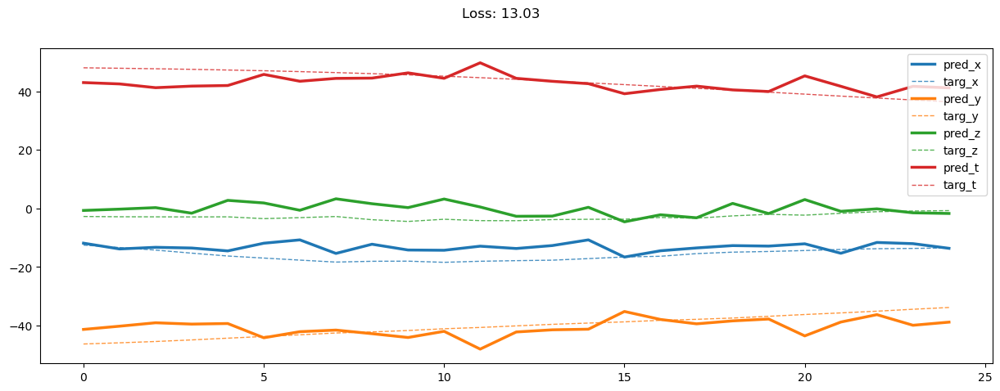

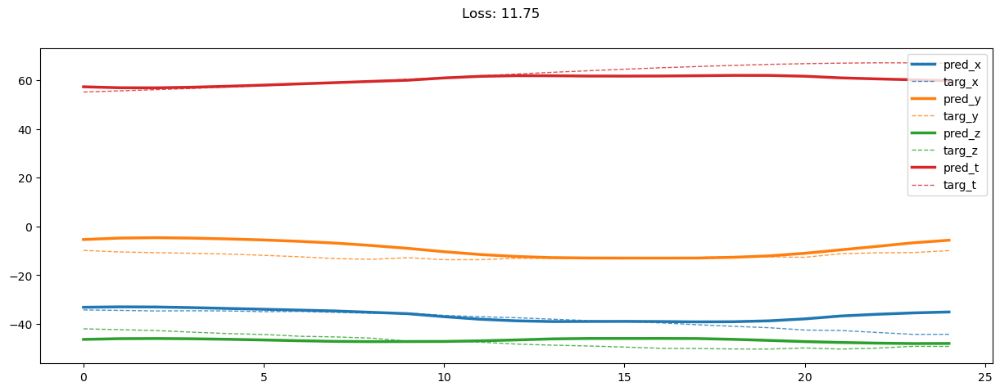

05800: train loss:  50.391, imu loss:  0.125, mag loss:  15.760, div loss:  31.367, slim:  4.574, tlim:  2.659
       valid loss:  114.016, imu loss:  0.094, mag loss:  48.527, div loss:  61.102, slim:  4.687, tlim:  4.164
05820: train loss:  50.634, imu loss:  0.125, mag loss:  15.783, div loss:  31.592, slim:  4.561, tlim:  2.658
       valid loss:  114.343, imu loss:  0.094, mag loss:  48.738, div loss:  61.225, slim:  4.646, tlim:  4.167
05840: train loss:  50.053, imu loss:  0.124, mag loss:  15.627, div loss:  31.174, slim:  4.563, tlim:  2.649
       valid loss:  113.510, imu loss:  0.093, mag loss:  48.028, div loss:  61.116, slim:  4.673, tlim:  4.139
05860: train loss:  50.201, imu loss:  0.125, mag loss:  15.685, div loss:  31.258, slim:  4.562, tlim:  2.656
       valid loss:  114.926, imu loss:  0.094, mag loss:  48.914, div loss:  61.615, slim:  4.668, tlim:  4.182
05880: train loss:  50.086, imu loss:  0.125, mag loss:  15.619, div loss:  31.206, slim:  4.582, tlim:  2.6

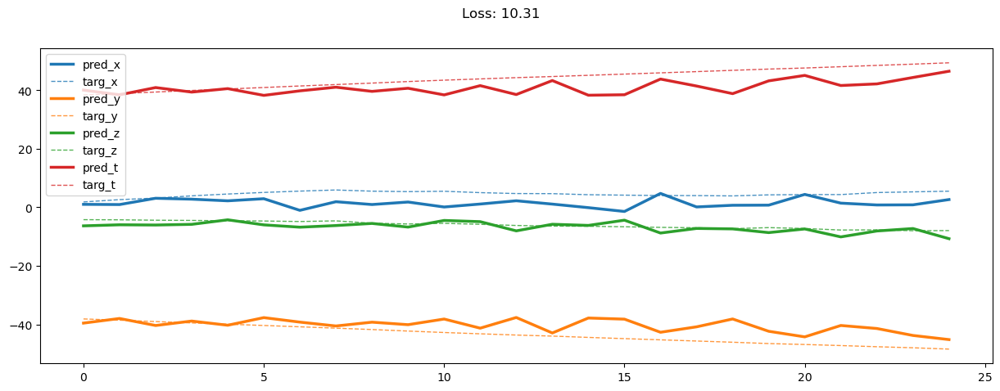

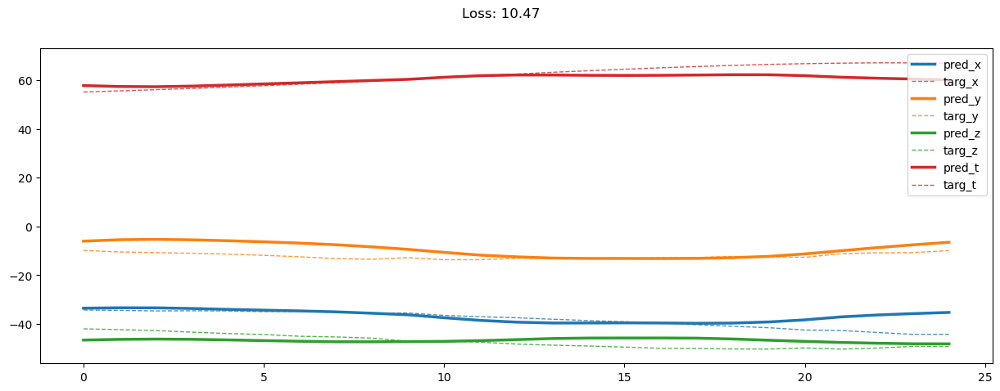

06000: train loss:  49.621, imu loss:  0.126, mag loss:  15.444, div loss:  30.930, slim:  4.577, tlim:  2.636
       valid loss:  114.432, imu loss:  0.093, mag loss:  48.425, div loss:  61.592, slim:  4.703, tlim:  4.194


In [25]:
draw = True

for epoch in range(EPOCH):
    #####
    # 1. 用上半部訓練50epoch
    # 2. 隨機用上或下半部訓練Model
    # 3. 印出trajectory結果
    #####
    
    if (epoch + 1) % 200 == 0:
        draw = True
    
    train_loss, train_imu_loss, train_mag_loss, t_d1_loss, tlim_loss = train(train_loader, draw)
    valid_loss, valid_imu_loss, valid_mag_loss, v_d1_loss, vlim_loss = evalute(valid_loader, draw)
    
    draw = False
    
    if (epoch + 1) % 20 == 0:
        ep = str(epoch + 1).zfill(5)
        print(f'{ep:>5}: train loss: {train_loss: 2.3f}, imu loss: {train_imu_loss: 2.3f}, mag loss: {train_mag_loss: 2.3f}, div loss: {t_d1_loss: 2.3f}, slim: {tlim_loss[0]: 2.3f}, tlim: {tlim_loss[1]: 2.3f}\n' +
              f'{"":>5}  valid loss: {valid_loss: 2.3f}, imu loss: {valid_imu_loss: 2.3f}, mag loss: {valid_mag_loss: 2.3f}, div loss: {v_d1_loss: 2.3f}, slim: {vlim_loss[0]: 2.3f}, tlim: {vlim_loss[1]: 2.3f}')

In [30]:
def output_eval(model, dataloader):
    model.eval()
    
    results = []
    class_results = []
    class_labels = []
    
    with torch.no_grad():
        for source_data, source_label, target_data, target_label in dataloader:
            source_data = source_data.to(device)
            source_imu = source_data[:, :, :6]
            source_mag = source_data[:, :, 7:10]

            target_data = target_data.to(device)
            target_imu = target_data[:, :, :6]
            target_mag = target_data[:, :, 7:10]

            # generate mag
            z_imu, predict_mag = model(source_imu, source_mag)

            # generator loss
#             gen_loss, imu_loss, mag_loss = generator_loss(z_imu, target_imu, predict_mag, target_mag)

            # record loss
            predict_mag = predict_mag.detach().cpu().numpy()
            target_mag = target_mag.cpu().numpy()
            source_label = source_label.detach().cpu().numpy()
            
            results.extend(zip(predict_mag, target_mag, source_label))
            
            diff = np.power(predict_mag.reshape(len(predict_mag), -1, 3) - target_mag.reshape(len(target_mag), -1, 3), 2).mean(axis=1)
            class_results.extend(diff)
            class_labels.extend(source_label)
    
    return np.array(results, dtype=object), np.array(class_results), np.array(class_labels)

In [31]:
def plot_result(result):
    pred_mag = result[0].reshape(-1, 3)
    targ_mag = result[1].reshape(-1, 3)
    source_label = result[2]
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(15, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{classes[source_label]}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

(8973, 3) (8973,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    10.10     8.24     7.01     8.45
         pocket loss:    11.31     8.57     8.79     9.56
          swing loss:     9.06     9.20     8.65     8.97
        average loss:    10.17     8.66     8.14     8.99


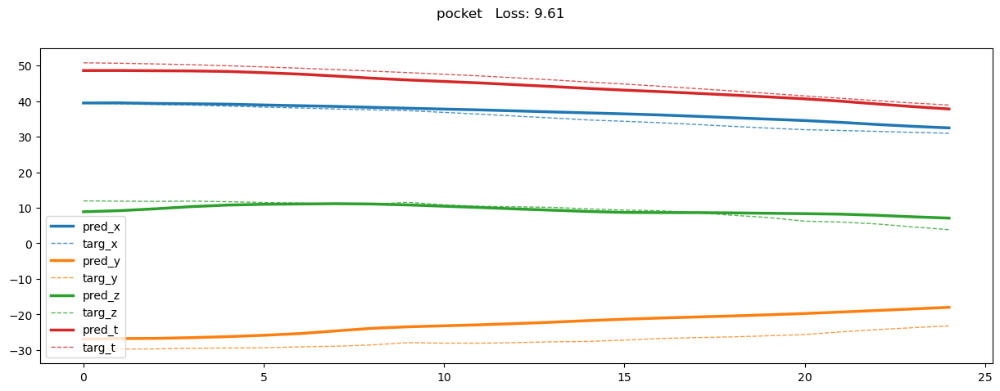

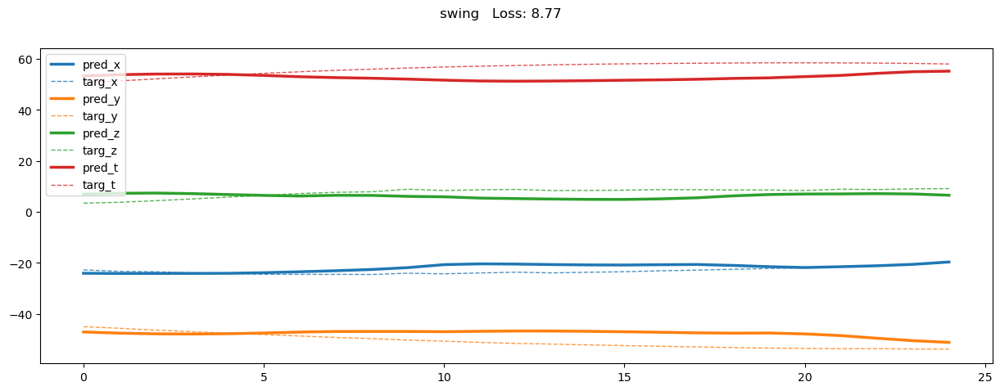

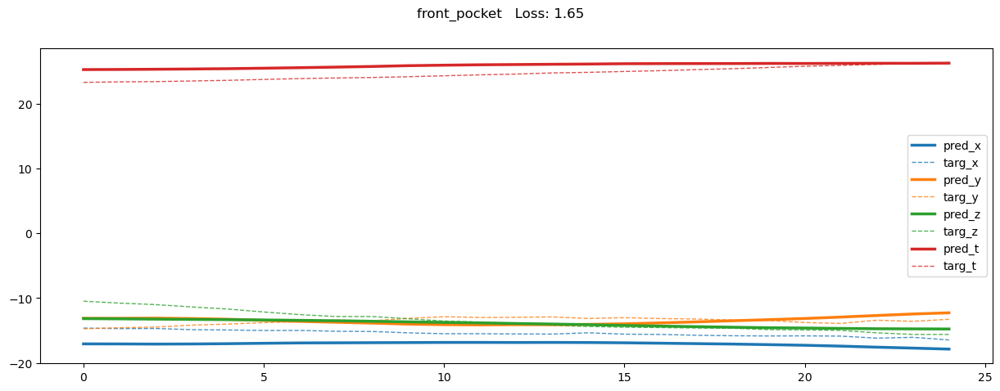

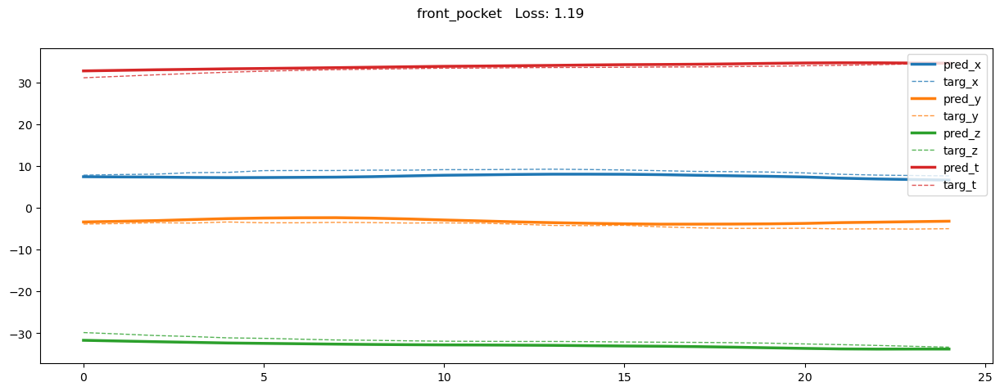

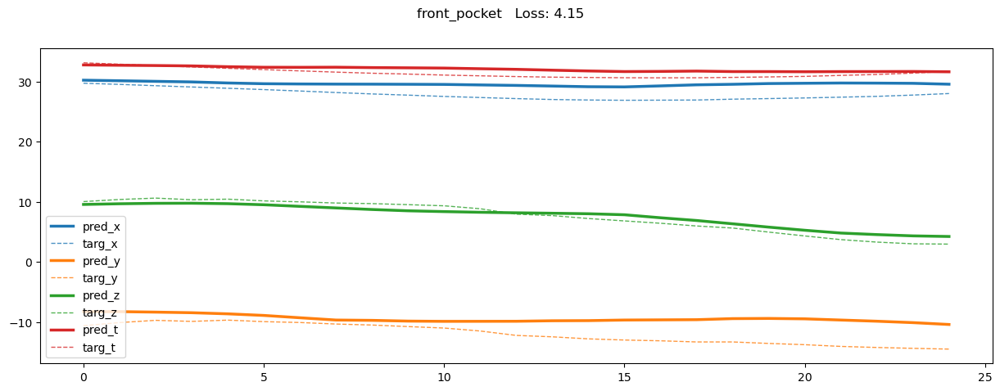

...

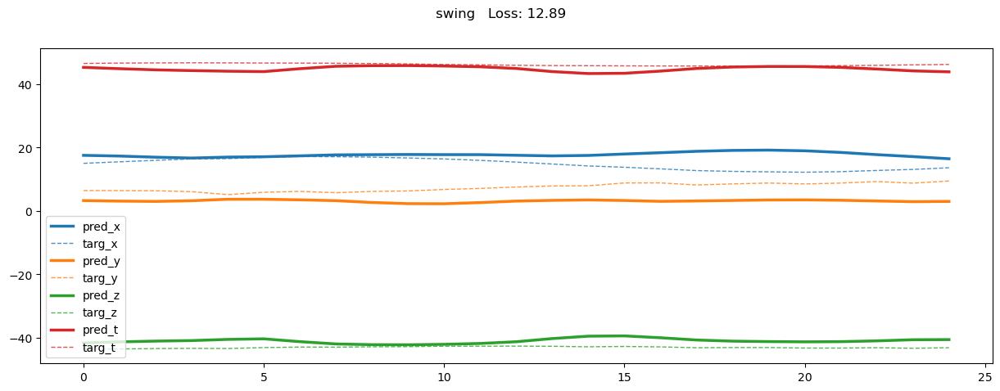

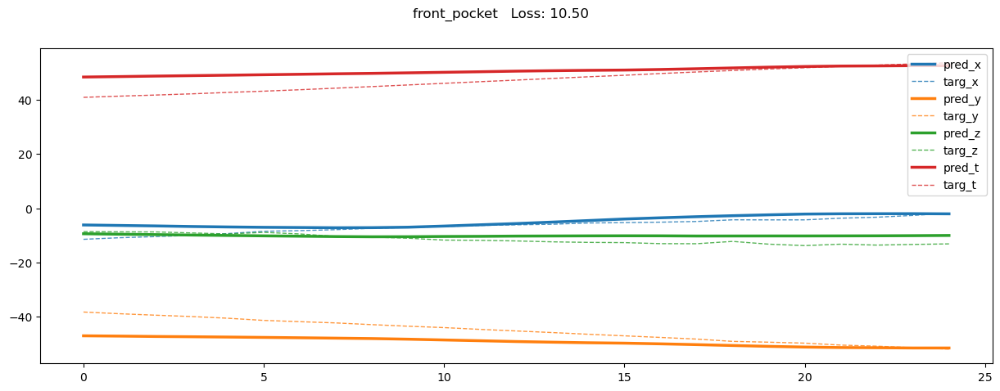

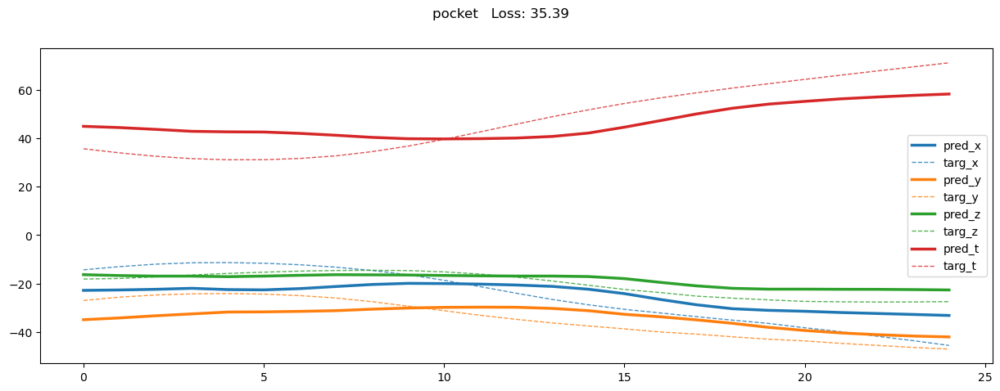

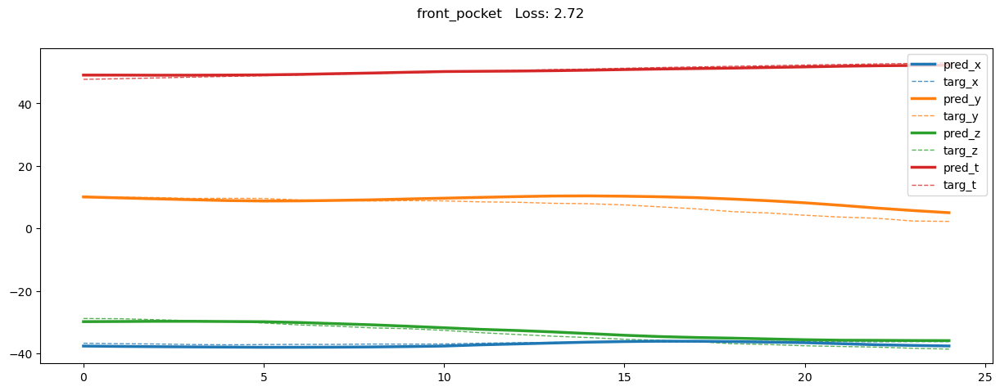

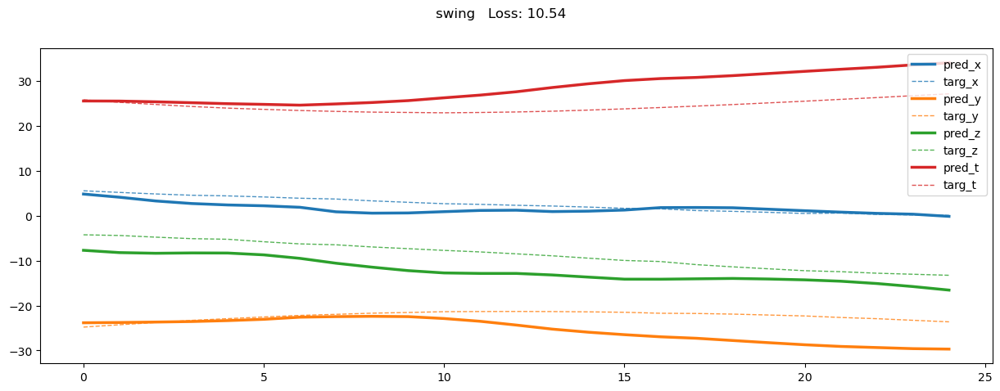

In [38]:
results, cres, clabel = output_eval(model, train_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::500]:
    plot_result(rs)

(1273, 3) (1273,)
           loss name|   diff x   diff y   diff z      avg
   front_pocket loss:    23.37    19.94    16.77    20.03
         pocket loss:    60.72    55.43    45.33    53.83
          swing loss:    71.77    60.29    66.50    66.19
        average loss:    50.78    44.14    41.89    45.60


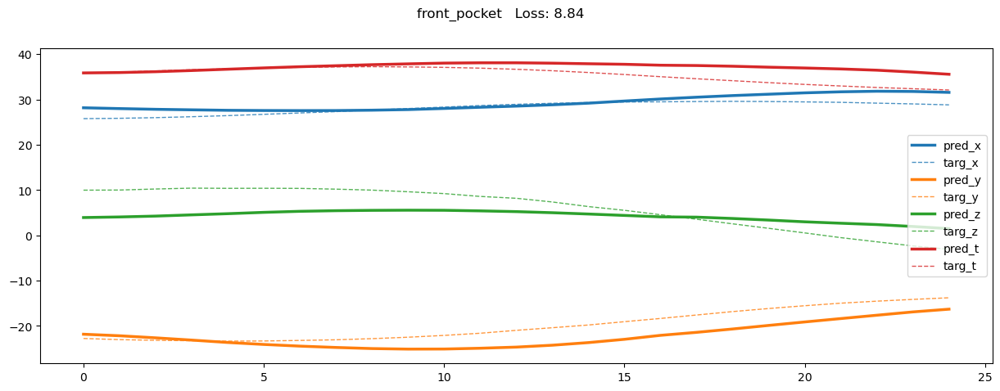

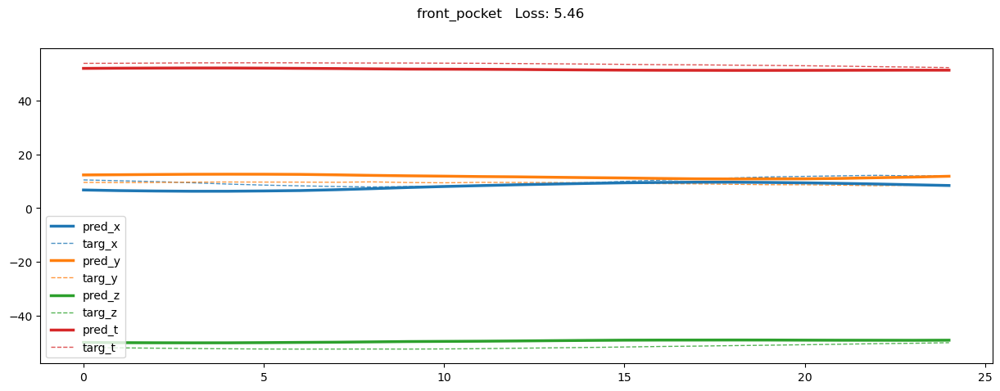

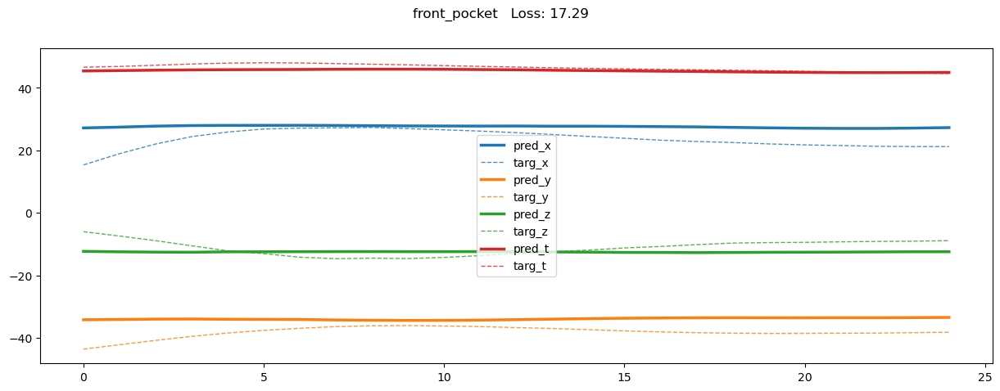

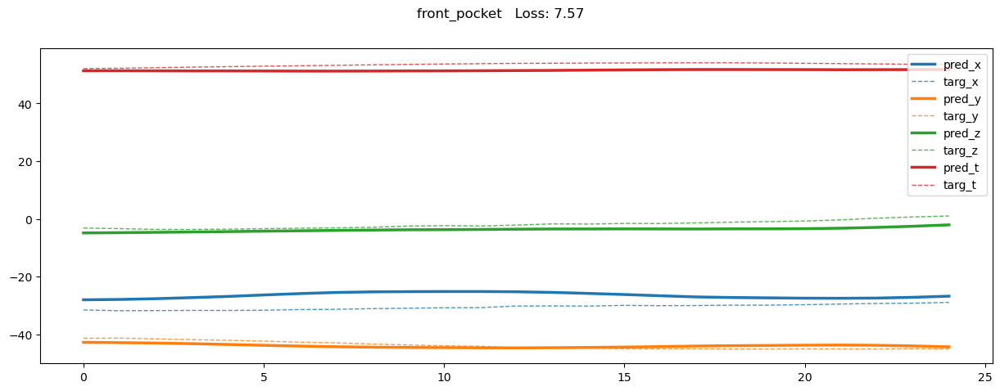

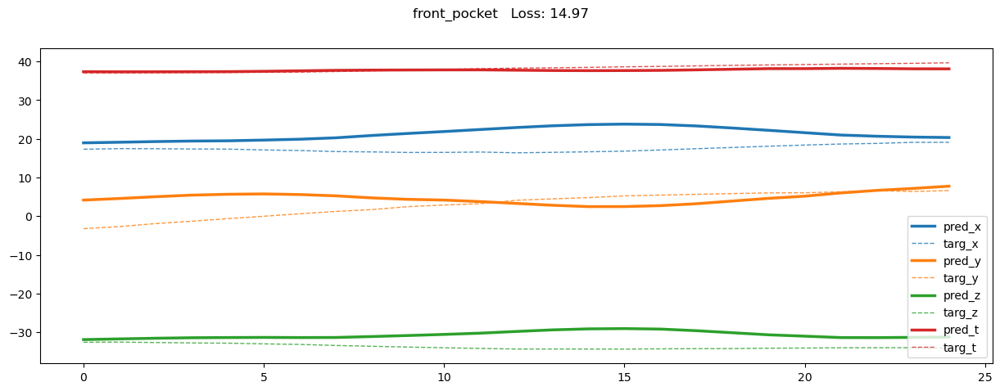

...

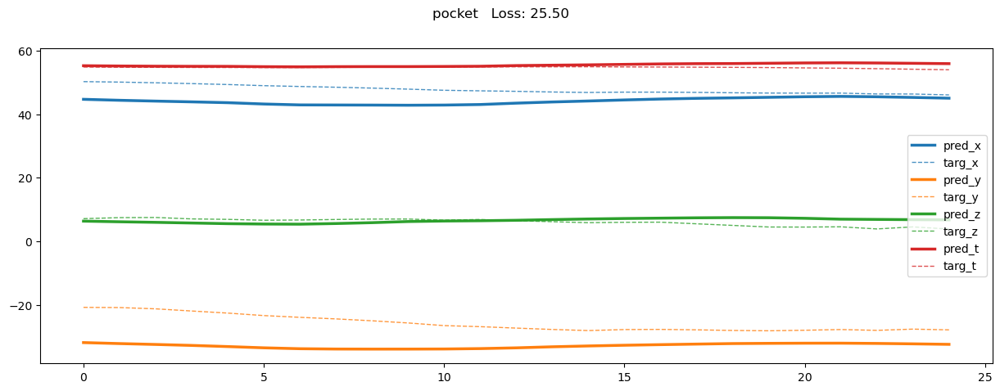

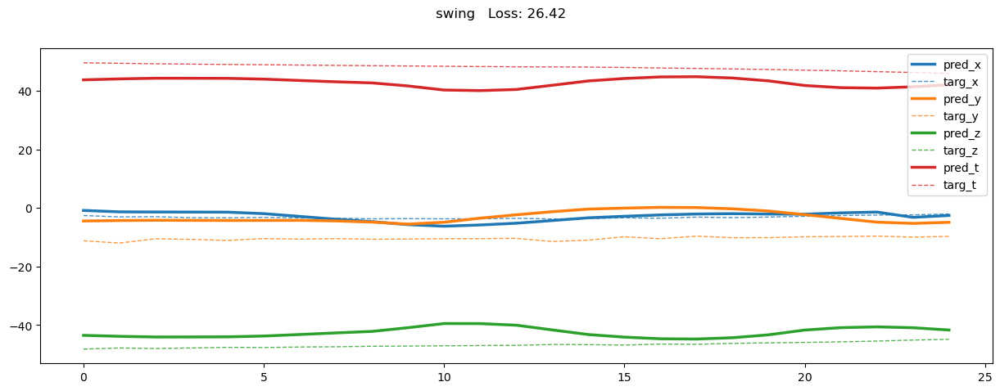

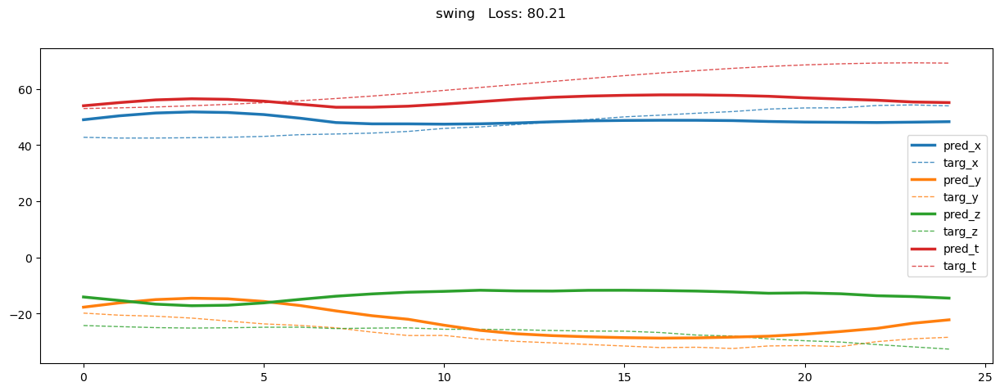

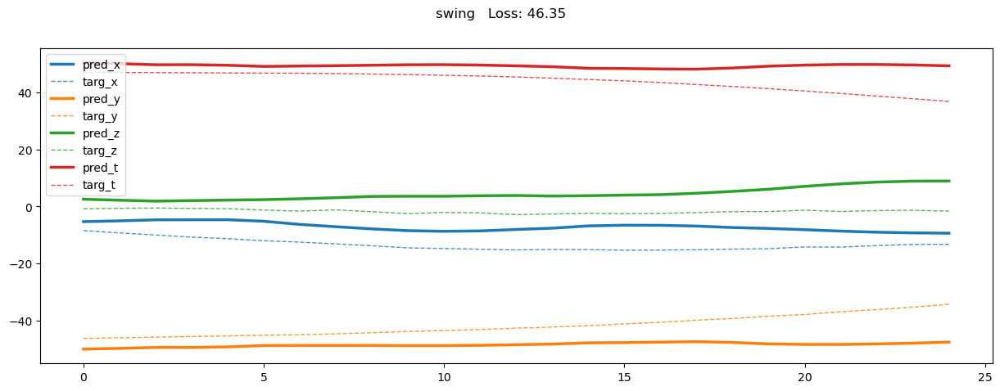

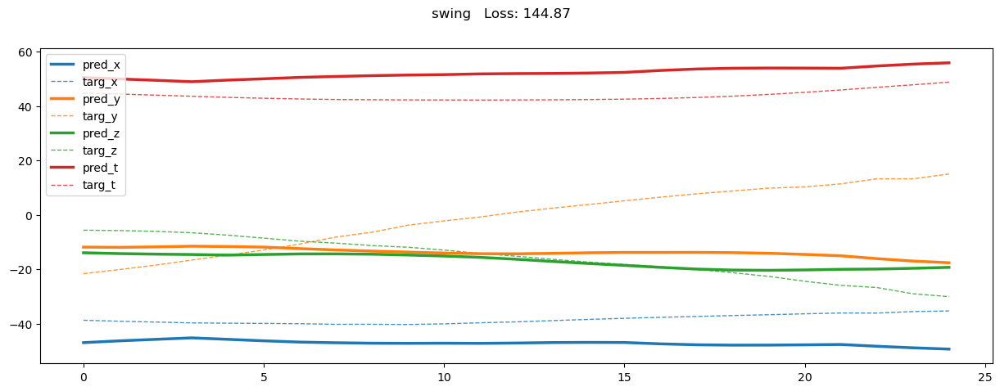

In [33]:
results, cres, clabel = output_eval(model, valid_loader)
print(cres.shape, clabel.shape)

print(f'{"loss name":>20}| {"diff x":>8} {"diff y":>8} {"diff z":>8} {"avg":>8}')
for class_label, class_name in classes.items():
    if sum(clabel == class_label) <= 0:
        continue
    dx, dy, dz = cres[clabel == class_label].mean(axis=0)
    print(f'{class_name:>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')
dx, dy, dz = cres.mean(axis=0)
print(f'{"average":>15} loss: {dx:>8.2f} {dy:>8.2f} {dz:>8.2f} {np.mean([dx, dy, dz]):>8.2f}')

for rs in results[::100]:
    plot_result(rs)

In [34]:
def plot_eval_result(result, path):
    pred_mag = np.stack(results[:, 0], axis=0)[:, 0].reshape(-1, 3)
    targ_mag = np.stack(results[:, 1], axis=0)[:, 0].reshape(-1, 3)
    x = np.arange(len(pred_mag))
    
    loss = mse_loss(torch.tensor(pred_mag), torch.tensor(targ_mag)).item()
    
    fig = plt.figure(figsize=(25, 5))
    
    for pm, tm, caxis, color in zip(pred_mag.T, targ_mag.T, ['x', 'y', 'z'], ['tab:blue', 'tab:orange', 'tab:green']):
        plt.plot(x, pm, label=f'pred_{caxis}', color=color, linewidth=2.5, zorder=2)
        plt.plot(x, tm, '--', label=f'targ_{caxis}', color=color, linewidth=1, alpha=0.8, zorder=1)
    
    pred_total_mag = np.sqrt(np.sum(np.power(pred_mag, 2), axis=-1))
    targ_total_mag = np.sqrt(np.sum(np.power(targ_mag, 2), axis=-1))
    plt.plot(x, pred_total_mag, label=f'pred_t', color='tab:red', linewidth=2.5, zorder=2)
    plt.plot(x, targ_total_mag, '--', label=f'targ_t', color='tab:red', linewidth=1, alpha=0.8, zorder=1)
    
    plt.suptitle(f'{path}   Loss: {loss:.2f}')
    plt.legend()
    plt.show()

In [39]:
def load_data(folder_path):
    source_path = os.path.join(folder_path, 'source')
    target_path = os.path.join(folder_path, 'target')

    #########################
    ##### check devices #####
    #########################
    source_path, target_path = check_data_device(source_path, target_path)

    ####################################
    ##### load and preprocess data #####
    ####################################
    source_df = load_original_data(source_path, rotate=False)
    target_df = load_original_data(target_path, rotate=True)

    source_df, target_df = bound_range(source_df), bound_range(target_df)
    source_df, target_df = align_data(source_df, target_df)
    
    return select_data(source_df), select_data(target_df)



def split_data(df):
    ncols = seq_len
    nrows = len(df) - seq_len + 1
    
    index = np.zeros((nrows, ncols), dtype=int)
    index += np.arange(ncols)
    index += np.arange(nrows).T[:, None]
    
    return df.to_numpy()[index]    

def combine_to_dataloader(source, target):
    dataset = PairDataset(
                        source_data = torch.tensor(source, dtype=torch.float),
                        source_label = np.zeros(len(source)),
                        target_data = torch.tensor(target, dtype=torch.float),
                        target_label = np.zeros(len(target)),
                    )
    dataloader = DataLoader(dataset, batch_size=512, shuffle=False)
    
    return dataloader

def generate_dataloader(folder_path):
    source_df, target_df = load_data(folder_path)
    source_segs, target_segs = split_data(source_df), split_data(target_df)

    return combine_to_dataloader(source_segs, target_segs)

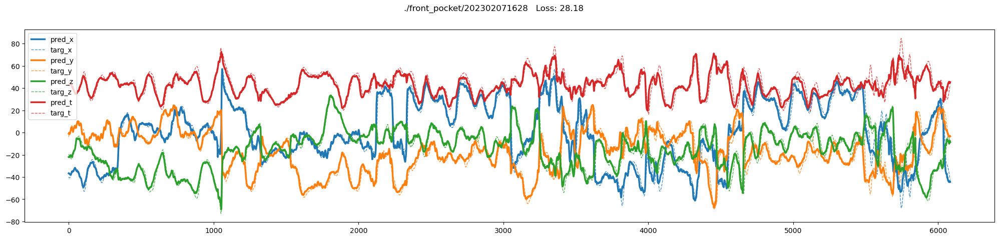

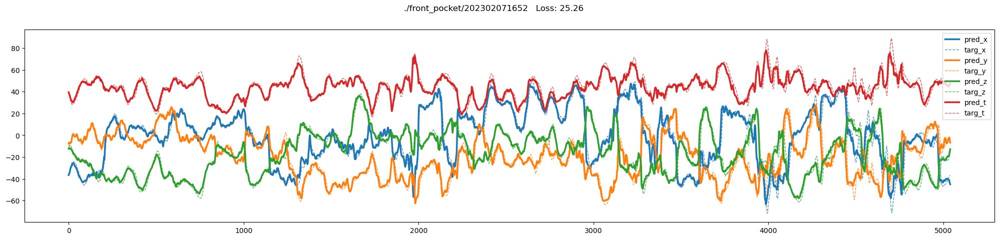

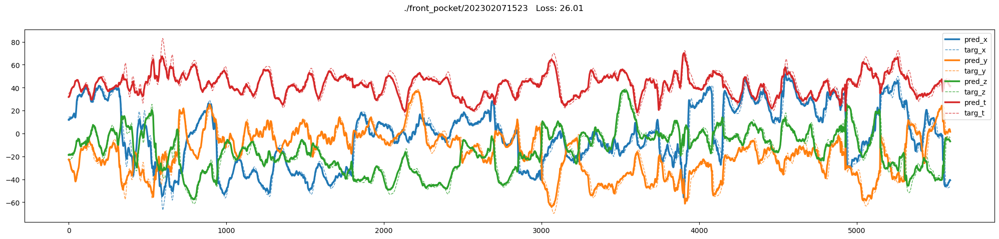

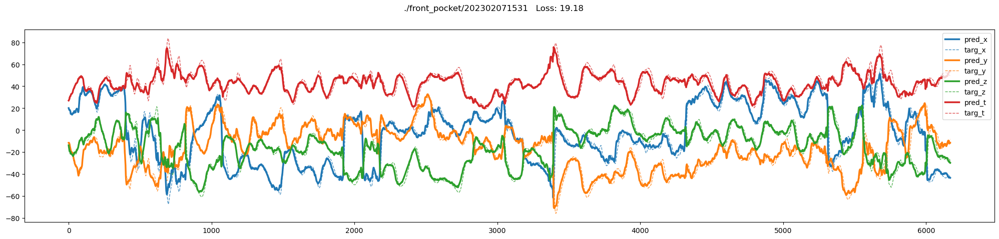

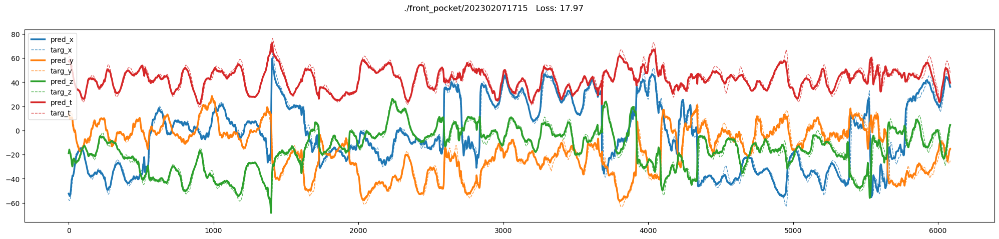

...

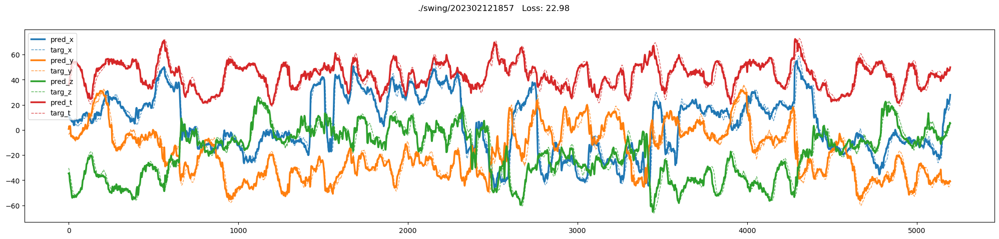

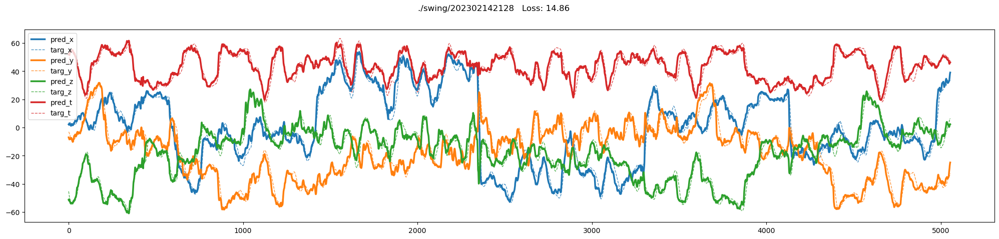

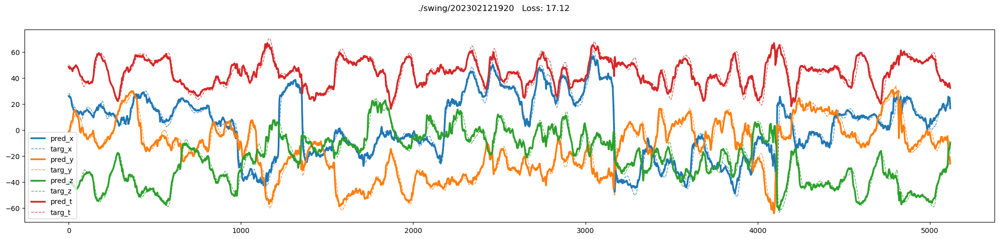

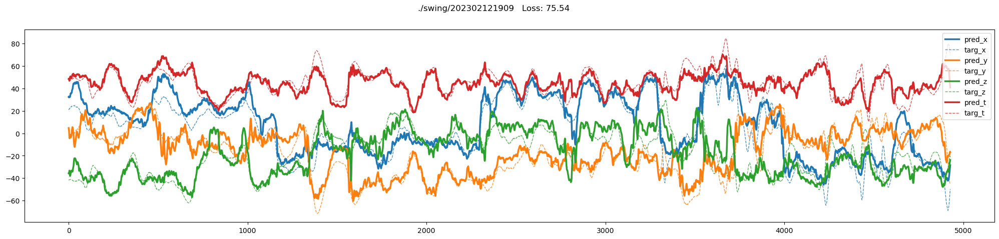

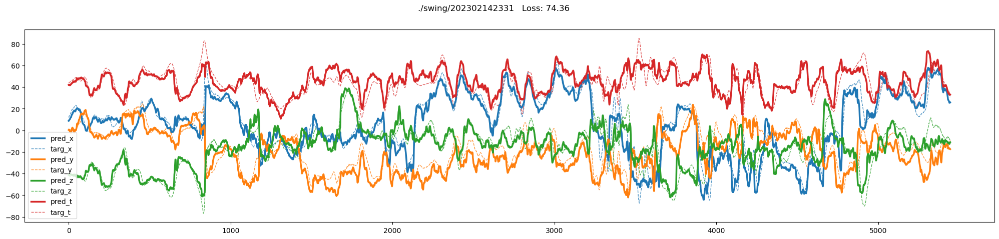

In [40]:
for folder in ['./front_pocket/*', './pocket/*', './swing/*']:
    for path in glob.glob(folder):
        eval_loader = generate_dataloader(path)
        results, _, _ = output_eval(model, eval_loader)
        plot_eval_result(results, path)